In [83]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from glob import glob
import os
import seaborn as sns

# Load Price Data

In [84]:
data_dir = "MODEL"  # change if needed

# List all CSVs
csv_files = glob(os.path.join(data_dir, "*_merged_daily.csv"))

# Initialize an empty dictionary to store stock data
stock_data = {}

# Read each file
for file in csv_files:
    # Extract stock symbol from filename
    stock_symbol = os.path.basename(file).split("_")[0]
    
    # Read CSV
    df = pd.read_csv(file, parse_dates=["date"], index_col="date")
    
    # Use 'Adj Close' if available, else 'Close'
    price_col = "close"
    
    # Rename column to stock symbol
    stock_data[stock_symbol] = df[price_col].rename(stock_symbol)

# Combine all series into a single DataFrame by date
merged_df = pd.concat(stock_data.values(), axis=1).sort_index()

# Drop rows with any missing values (optional)
df = merged_df.reset_index()


# Time Series Plots of Price and Return

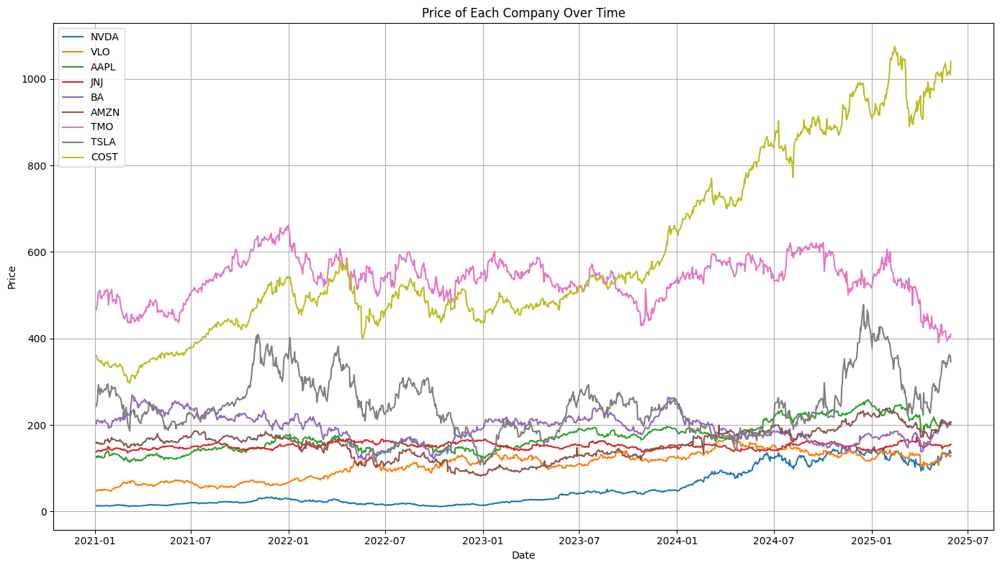

In [85]:
plt.figure(figsize=(14, 8))
for column in df.columns[1:]:
    plt.plot(df.date, df[column], label=column)

plt.title('Price of Each Company Over Time')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [86]:
price = df.copy()

In [87]:
log_returns = np.log(df.iloc[:, 1:] / df.iloc[:, 1:].shift(1))

# Optional: include the date for reference
log_returns['date'] = df['date']

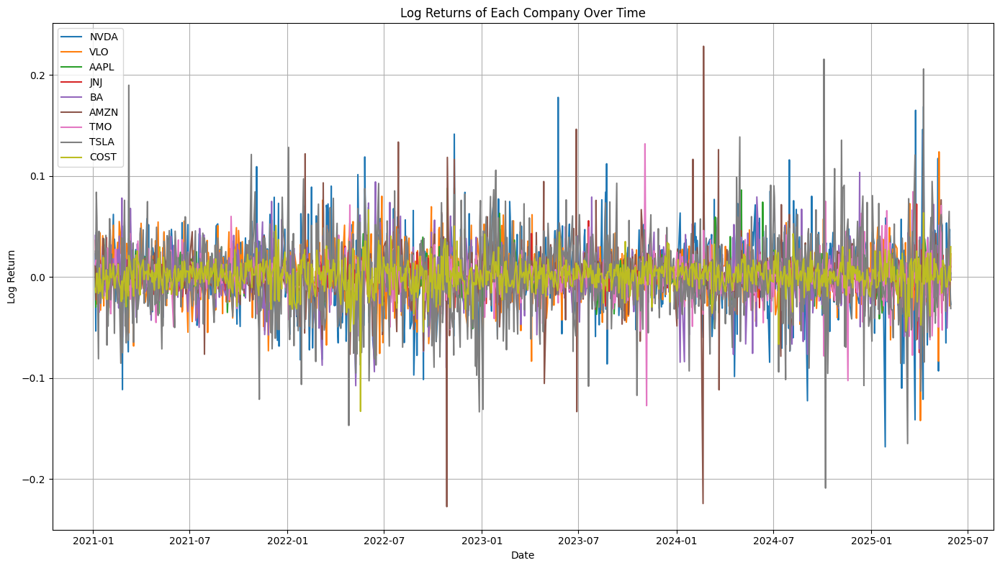

In [88]:
log_returns = log_returns.set_index("date")
plt.figure(figsize=(14, 8))
for column in log_returns.columns:
    plt.plot(log_returns.index, log_returns[column], label=column)

plt.title('Log Returns of Each Company Over Time')
plt.xlabel('Date')
plt.ylabel('Log Return')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Summary Statistics of Return

In [89]:
import statsmodels.api as sm
from statsmodels.graphics.tsaplots import plot_acf
from scipy.stats import norm, probplot
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

def plot_return_diagnostics(returns, ticker):
    fig, axs = plt.subplots(2, 2, figsize=(12, 8))
    fig.suptitle(f'{ticker} Return Diagnostics', fontsize=16)

    # 1. Histogram with normal curve
    sns.histplot(returns, kde=False, stat='density', ax=axs[0, 0], color='skyblue', bins=30)
    mu, std = returns.mean(), returns.std()
    xmin, xmax = axs[0, 0].get_xlim()
    x = np.linspace(xmin, xmax, 100)
    axs[0, 0].plot(x, norm.pdf(x, mu, std), 'k', linewidth=2, label='Normal Curve')
    axs[0, 0].set_title('Histogram with Normal Curve')
    axs[0, 0].legend()

    # 2. Boxplot
    sns.boxplot(x=returns, ax=axs[0, 1], color='lightgreen')
    axs[0, 1].set_title('Boxplot')

    # 3. Autocorrelation (ACF) plot - FIXED
    plot_acf(returns.dropna(), ax=axs[1, 0], lags=20, alpha=None)  # alpha=None removes confidence intervals
    axs[1, 0].set_title('Autocorrelation (ACF)')
    axs[1, 0].set_ylim(-1.1, 1.1)  # Ensure consistent y-axis
    
    # 4. Q-Q plot
    probplot(returns.dropna(), dist="norm", plot=axs[1, 1])
    axs[1, 1].set_title('Normal Q-Q Plot')
    axs[1, 1].get_lines()[0].set_markerfacecolor('blue')  # Customize markers
    axs[1, 1].get_lines()[1].set_color('red')  # Customize reference line

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.savefig(f"{ticker}_summary.png")
    plt.show()


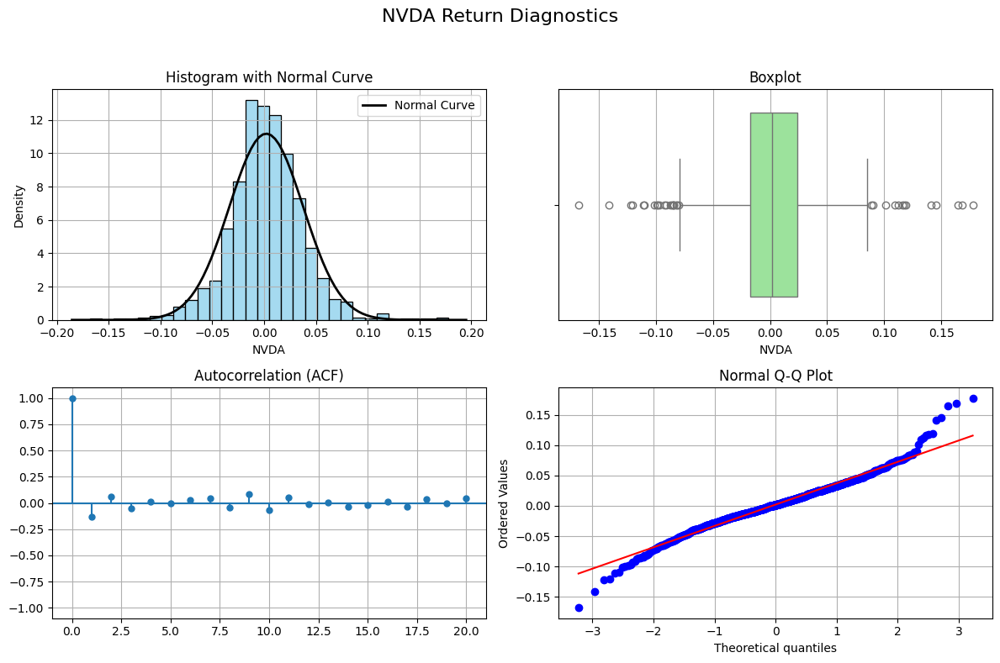

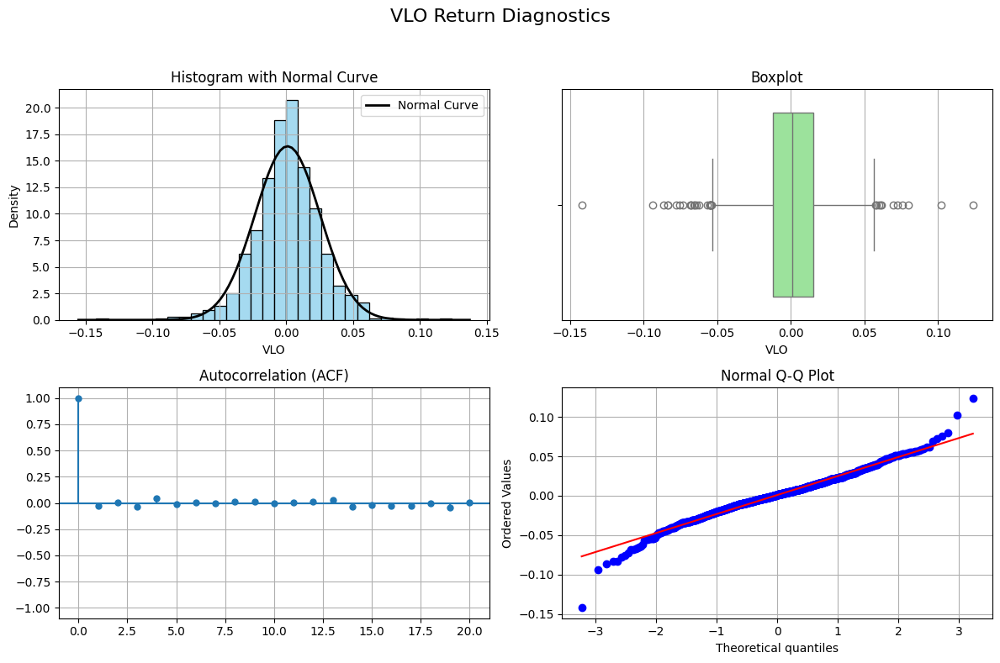

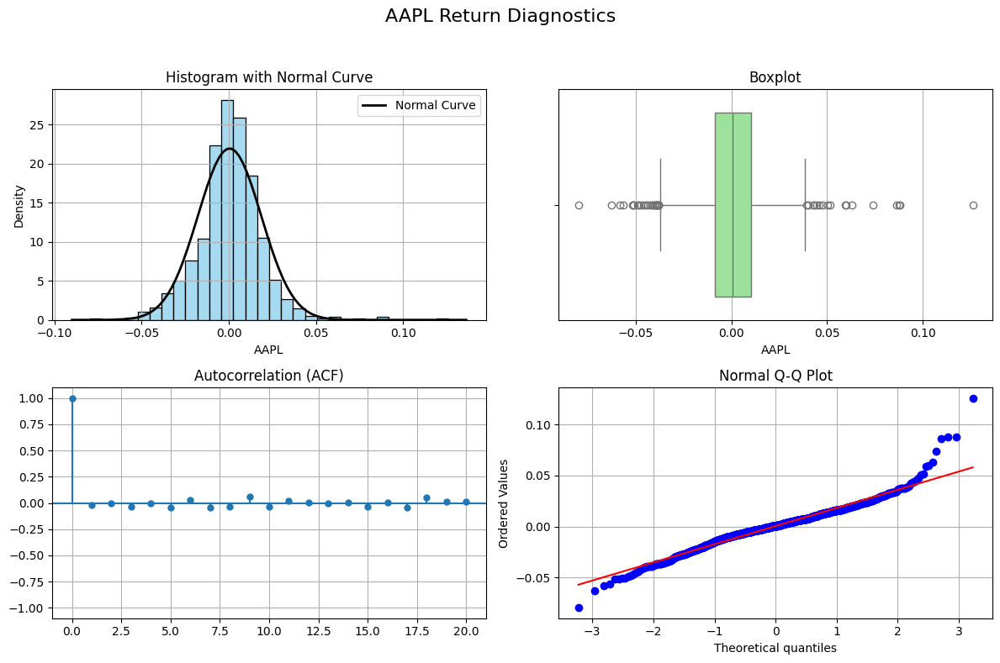

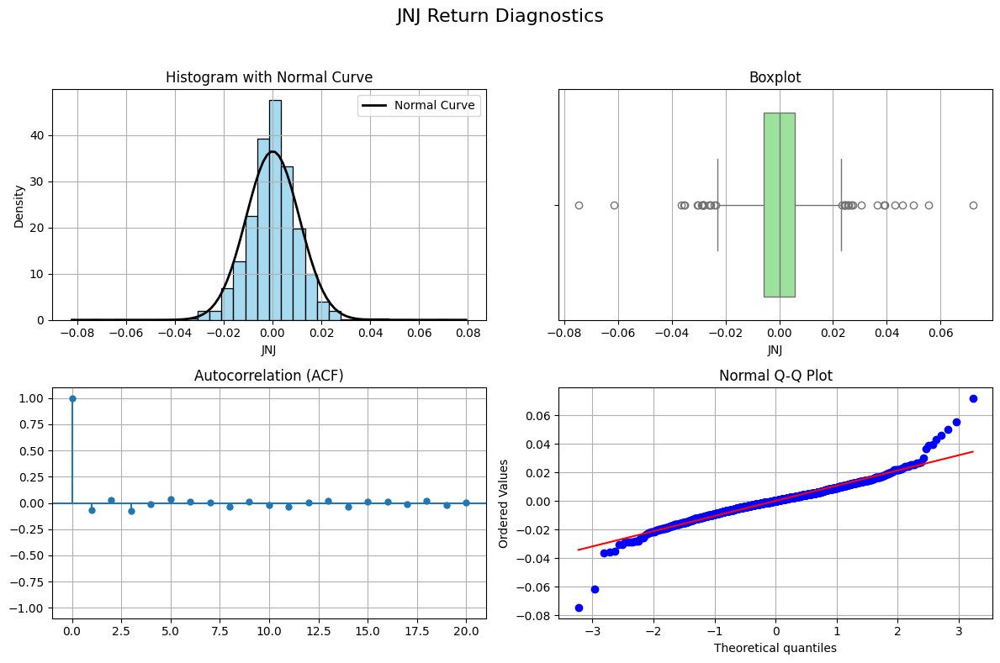

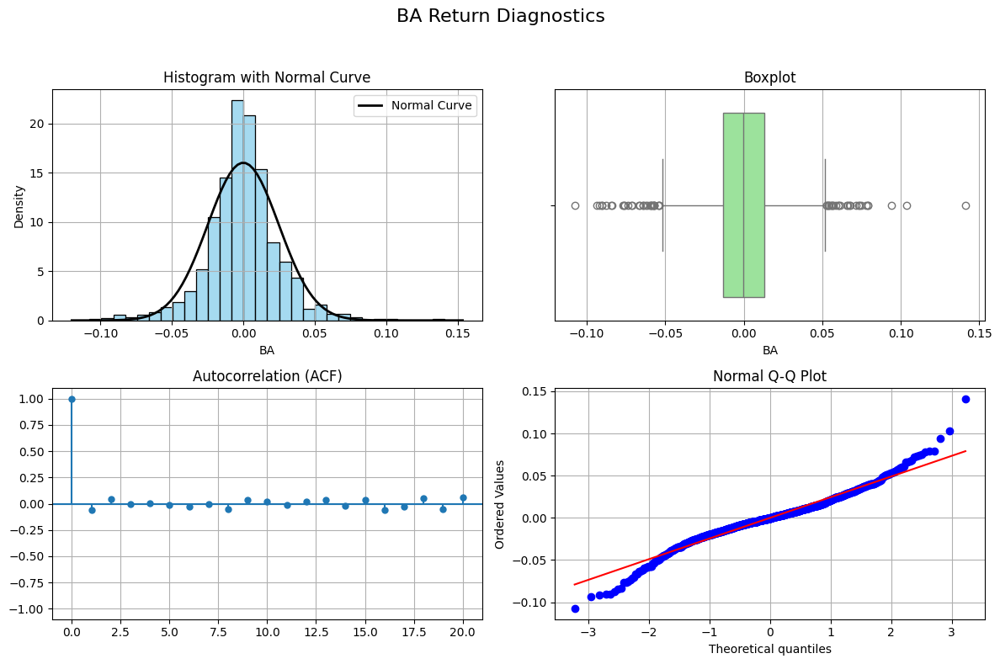

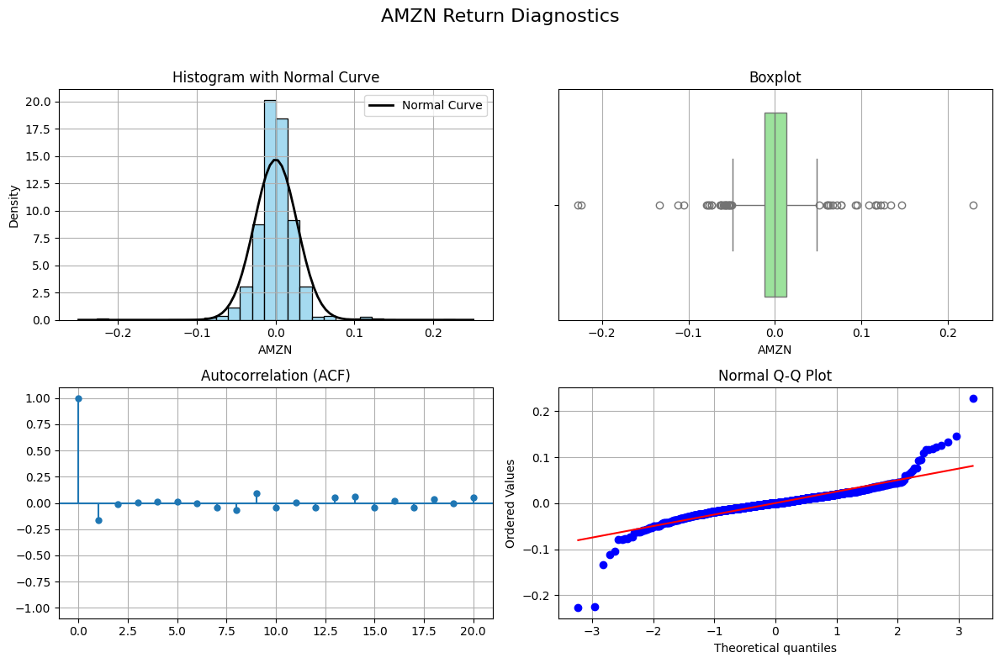

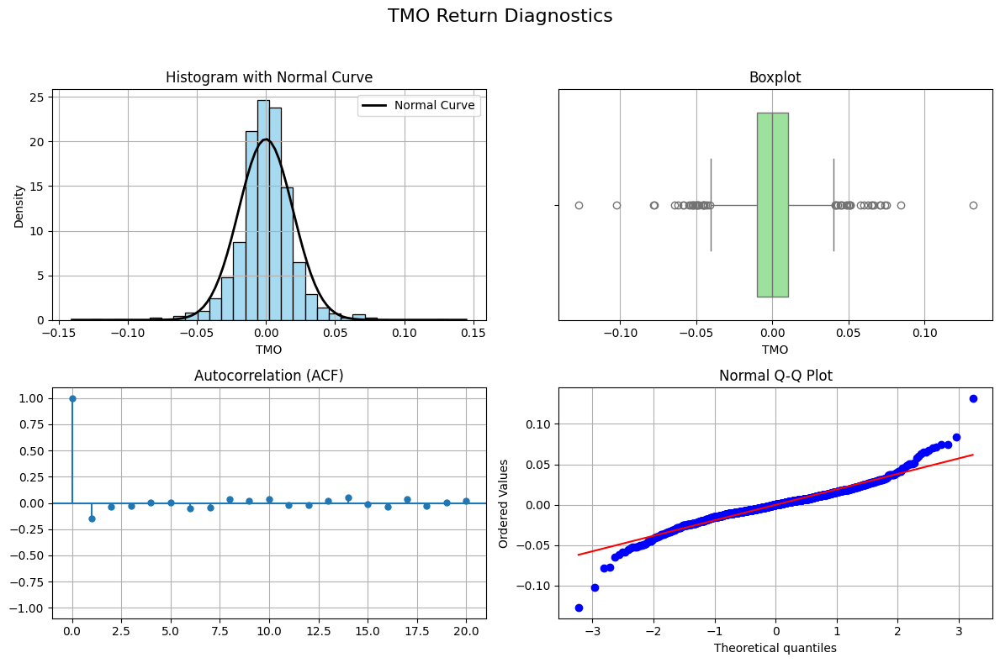

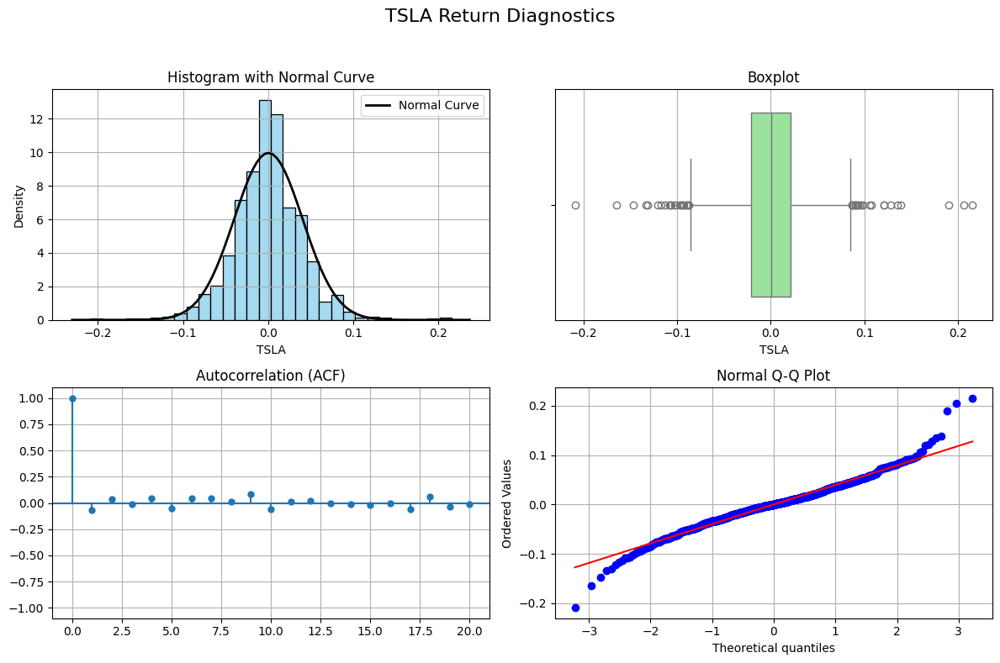

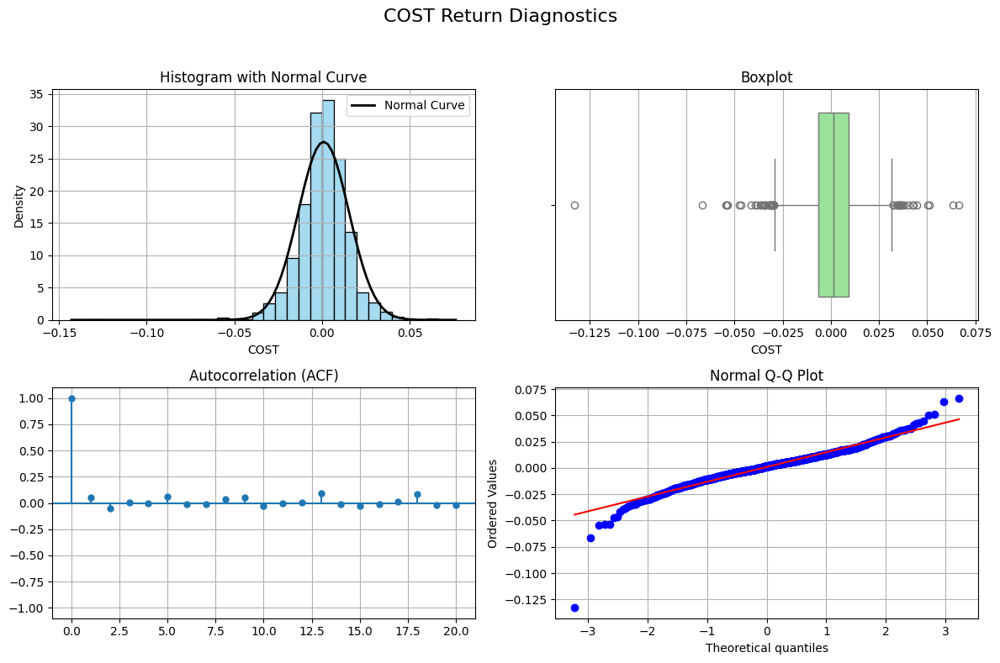

In [90]:
for ticker in log_returns.columns:
    plot_return_diagnostics(log_returns[ticker], ticker)

In [91]:
from scipy.stats import kurtosis

kurtosis_results = {}
for ticker in log_returns.columns:  # Exclude date column
    kurtosis_results[ticker] = kurtosis(log_returns[ticker].dropna(), fisher=True)
    
kurtosis_df = pd.DataFrame.from_dict(kurtosis_results, orient='index', columns=['Kurtosis'])
print(kurtosis_df.sort_values('Kurtosis', ascending=False))

       Kurtosis
AMZN  16.247620
COST   8.092194
JNJ    5.788666
TMO    5.337688
AAPL   3.988929
TSLA   2.933153
BA     2.747702
NVDA   2.529609
VLO    2.365601


In [92]:
# Normality Check
from scipy.stats import kstest, shapiro, anderson
normality_results = []

for ticker in log_returns.columns:  
    data = log_returns[ticker].dropna()
    
    # Kolmogorov-Smirnov (compares to normal distribution with same mean/std)
    ks_stat, ks_p = kstest(data, 'norm', args=(data.mean(), data.std()))
    
    # Shapiro-Wilk (best for small samples <5000)
    shapiro_stat, shapiro_p = shapiro(data)
    
    # Anderson-Darling (more sensitive to tails)
    anderson_result = anderson(data, dist='norm')
    anderson_stat = anderson_result.statistic
    # Get critical value at 5% significance level (index 2 in the array)
    anderson_crit = anderson_result.critical_values[2]
    
    normality_results.append({
        'Ticker': ticker,
        'KS Statistic': ks_stat,
        'KS p-value': ks_p,
        'Shapiro Statistic': shapiro_stat,
        'Shapiro p-value': shapiro_p,
        'Anderson-Darling Statistic': anderson_stat,
        'AD 5% Critical': anderson_crit,
        'AD Normal?': anderson_stat < anderson_crit
    })

# Convert to DataFrame
normality_df = pd.DataFrame(normality_results)
normality_df

,Ticker,KS Statistic,KS p-value,Shapiro Statistic,Shapiro p-value,Anderson-Darling Statistic,AD 5% Critical,AD Normal?
0,NVDA,0.044574,2.393244e-02,0.974134,3.730963e-13,4.548936,0.784,False
1,VLO,0.048464,1.071273e-02,0.979337,1.892935e-11,3.951585,0.784,False
2,AAPL,0.060543,5.755815e-04,0.960213,8.512070e-17,7.154293,0.784,False
3,JNJ,0.054615,2.620653e-03,0.947604,2.210183e-19,7.229907,0.784,False
4,BA,0.062293,3.570868e-04,0.965355,1.425650e-15,9.268518,0.784,False
5,AMZN,0.091275,1.810931e-08,0.851251,5.204057e-31,23.470884,0.784,False
6,TMO,0.069587,4.216367e-05,0.945034,7.485115e-20,10.253994,0.784,False
7,TSLA,0.051691,5.226906e-03,0.971326,5.557863e-14,5.619576,0.784,False
8,COST,0.057983,1.128930e-03,0.944618,6.304442e-20,7.485972,0.784,False


In [93]:
# Correlation Matrix of Log Returns

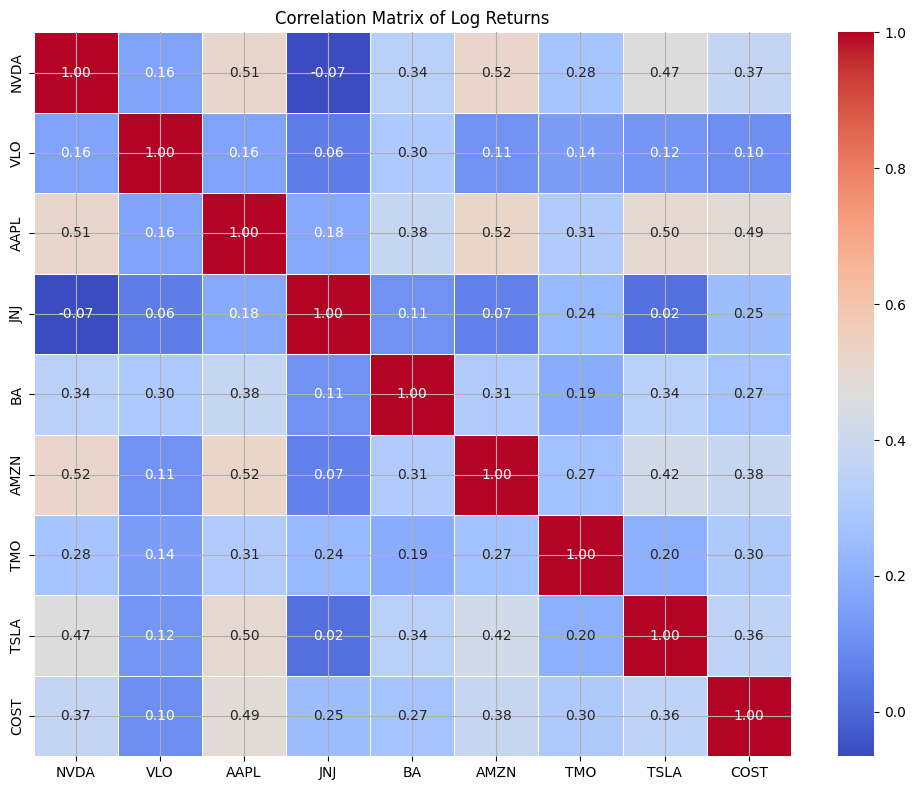

In [94]:
corr_matrix = log_returns.corr()
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap="coolwarm", linewidths=0.5)
plt.title("Correlation Matrix of Log Returns")
plt.tight_layout()
plt.show()

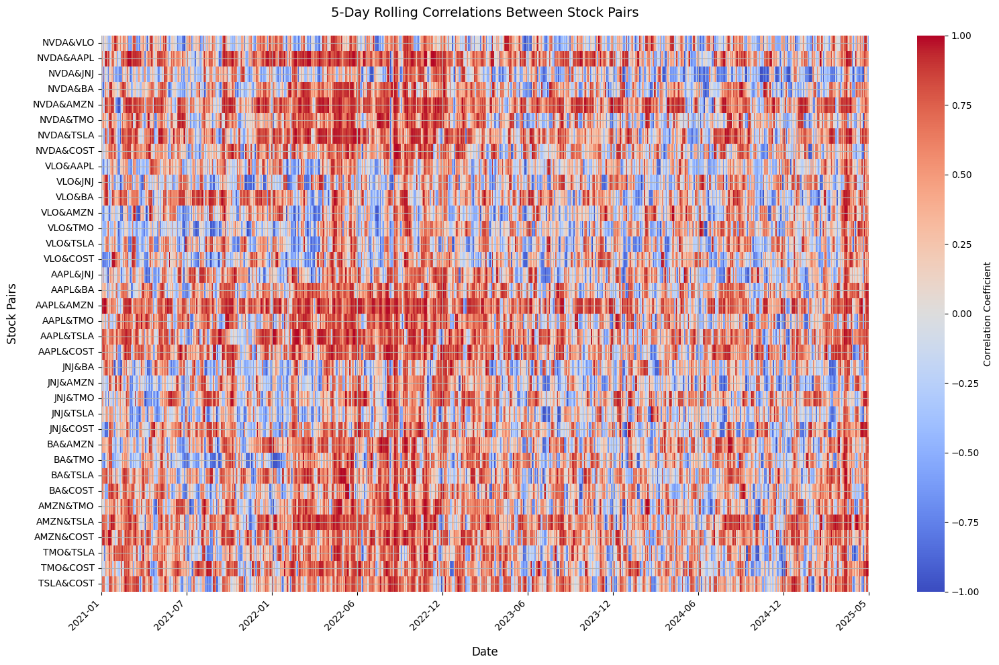

In [95]:
# 5 day rolling correlation
rolling_corr = log_returns.rolling(window=5).corr()
stocks = log_returns.columns
pairs = [(stocks[i], stocks[j]) for i in range(len(stocks)) for j in range(i+1, len(stocks))]


corr_df = pd.DataFrame(index=log_returns.index)

for pair in pairs:
    stock1, stock2 = pair
    pair_name = f"{stock1}&{stock2}"
    corr_values = rolling_corr[stock1].xs(stock2, level=1)
    corr_df[pair_name] = corr_values


corr_df = corr_df.iloc[5:]

plt.figure(figsize=(16, 10))
ax = sns.heatmap(corr_df.T, cmap='coolwarm', center=0, 
                vmin=-1, vmax=1, 
                cbar_kws={'label': 'Correlation Coefficient'})

# Improve x-axis (date) labels
ax.set_xticks(np.linspace(0, len(corr_df), 10))  # 10 evenly spaced ticks
ax.set_xticklabels([date.strftime('%Y-%m') for date in 
                   pd.date_range(start=corr_df.index[0], end=corr_df.index[-1], periods=10)],
                  rotation=45, ha='right')

# Improve y-axis (pair) labels
ax.set_yticklabels(ax.get_yticklabels(), rotation=0, fontsize=10)

# Add titles and labels
plt.title('5-Day Rolling Correlations Between Stock Pairs', pad=20, fontsize=14)
plt.ylabel('Stock Pairs', labelpad=15, fontsize=12)
plt.xlabel('Date', labelpad=15, fontsize=12)

# Adjust layout to prevent label cutoff
plt.tight_layout()
plt.savefig("corr.png")
# Show the plot
plt.show()

In [96]:
corr_df.to_csv("corr_mat.csv")

# Sentiment Score Distribution

In [97]:
news_data_path = 'News_data/'
news_dfs = {}

for filename in os.listdir(news_data_path):
    if filename.endswith('_clean.csv'):
        # Extract ticker name (e.g., 'AAPL' from 'AAPL_clean.csv')
        ticker = filename.split('_')[0]
        
        # Read CSV and store in dictionary
        filepath = os.path.join(news_data_path, filename)
        news_dfs[ticker] = pd.read_csv(filepath)

In [98]:
for ticker, df in news_dfs.items():
    cols_to_drop = [col for col in ["Unnamed: 0.1", "Unnamed: 0"] if col in df.columns]
    if cols_to_drop:
        news_dfs[ticker] = df.drop(columns=cols_to_drop)

In [99]:
for ticker, df in news_dfs.items():
    news_dfs[ticker] = df.drop_duplicates(subset='uuid')

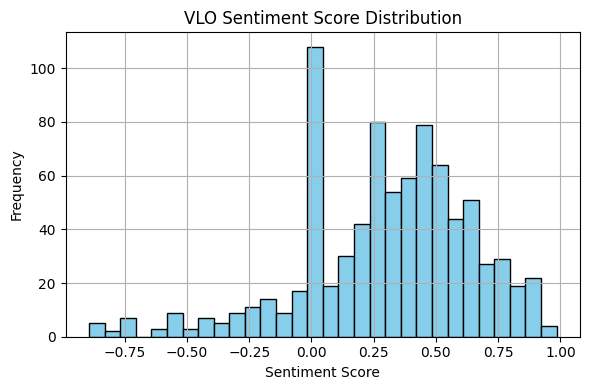

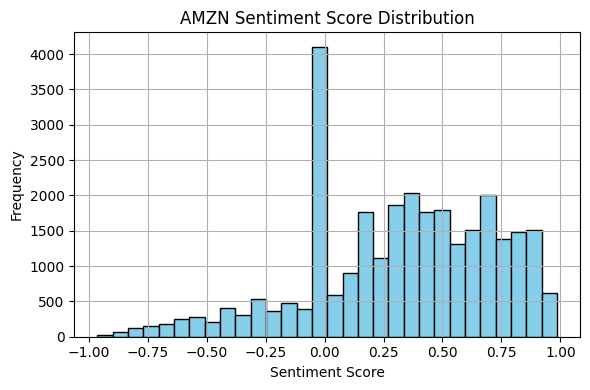

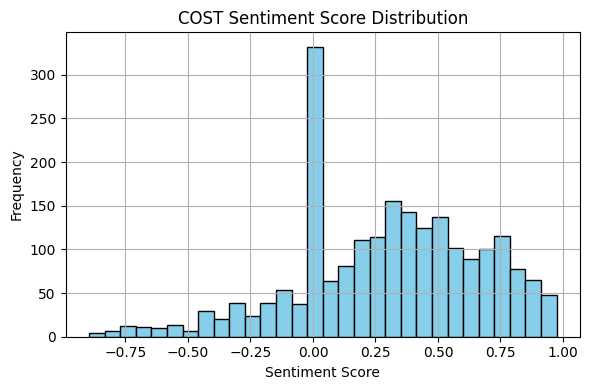

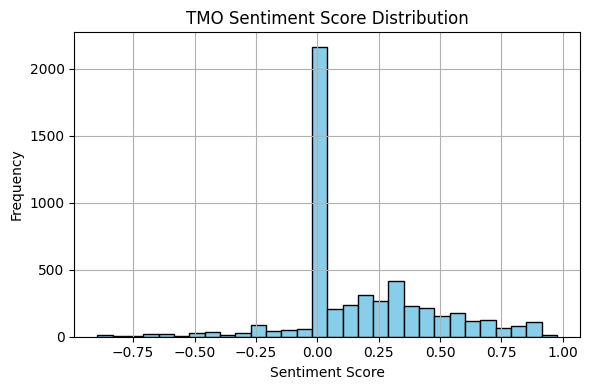

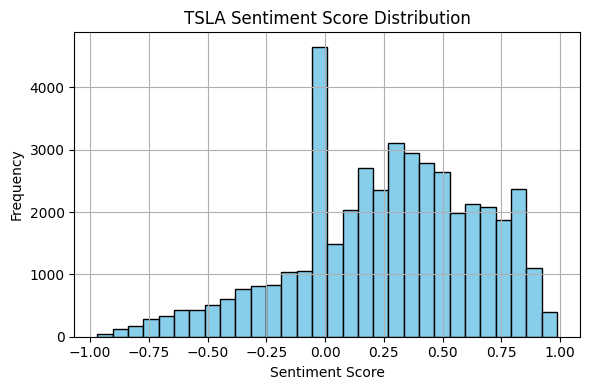

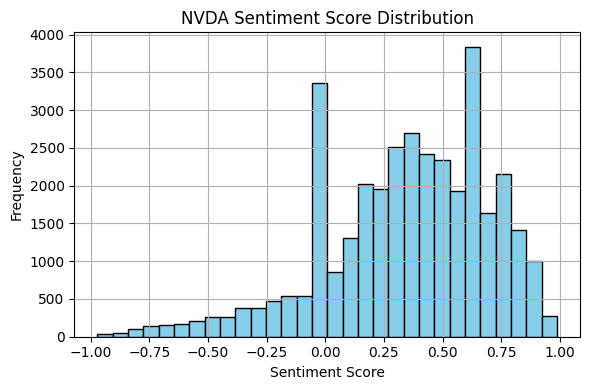

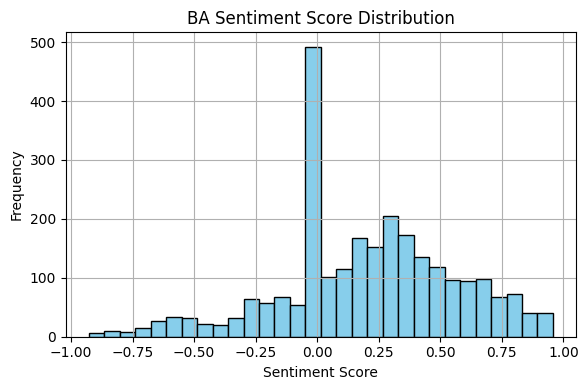

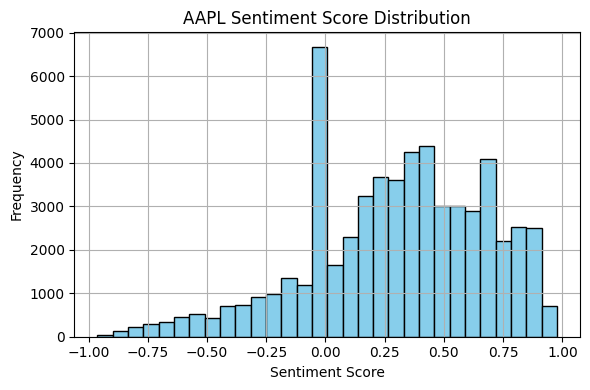

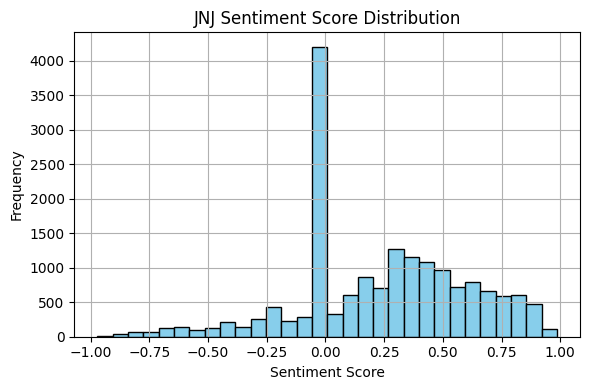

In [100]:
for ticker, df in news_dfs.items():
    # Keep relevant columns
    news_dfs[ticker] = df[["time", "match_score", "sentiment_score"]]

    # Plot histogram for each ticker
    plt.figure(figsize=(6, 4))
    plt.hist(news_dfs[ticker]["sentiment_score"].dropna(), bins=30, color='skyblue', edgecolor='black')
    plt.title(f"{ticker} Sentiment Score Distribution")
    plt.xlabel("Sentiment Score")
    plt.ylabel("Frequency")
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(f"{ticker}_sentiment_histogram.png")  # Optional: save each plot
    plt.show()


# Calculate Sentiment-Based Features 

In [101]:
import os

daily_stats = {}
all_data = []

# Step 1: Load all *_daily_sentiment_summary.csv files in current directory
for filename in os.listdir('.'):
    if filename.endswith('_daily_sentiment_summary.csv'):
        ticker = filename.split('_')[0]
        df = pd.read_csv(filename)
        df.rename(columns = {"adjusted_date":"date"}, inplace = True)

        # Ensure 'date' is datetime.date
        df['date'] = pd.to_datetime(df['date']).dt.date
        df['ticker'] = ticker
        all_data.append(df)

# Step 2: Combine all into a single DataFrame
combined_df = pd.concat(all_data, ignore_index=True)

# Step 3: Compute total news count per day
total_news_by_day = combined_df.groupby('date')['news_count'].sum().reset_index(name='total_news_count')

# Step 4: Merge to get news frequency
combined_df = combined_df.merge(total_news_by_day, on='date')
combined_df['news_frequency'] = combined_df['news_count'] / combined_df['total_news_count']

# Step 5: Compute frequency-weighted sentiment
combined_df['product'] = combined_df['mean_sentiment'] * combined_df['news_frequency']

# Step 6: Store result per ticker
for ticker in combined_df['ticker'].unique():
    df_ticker = combined_df[combined_df['ticker'] == ticker][
        ['date', 'mean_sentiment', "sentiment_variance", 'news_count', 'news_frequency', 'product']
    ].copy()
    daily_stats[ticker] = df_ticker.reset_index(drop=True)

# Example: Show AAPL result
print(daily_stats['AAPL'].head())


         date  mean_sentiment  sentiment_variance  news_count  news_frequency  \
0  2021-01-04        0.404221            0.066646           7        0.212121   
1  2021-01-05        0.141558            0.039668          11        0.250000   
2  2021-01-06        0.251017            0.091350           8        0.190476   
3  2021-01-07        0.057299            0.081728          14        0.378378   
4  2021-01-08        0.162538            0.056179          19        0.333333   

    product  
0  0.085744  
1  0.035390  
2  0.047813  
3  0.021681  
4  0.054179  


# Daily Average Sentiment Score Distribution

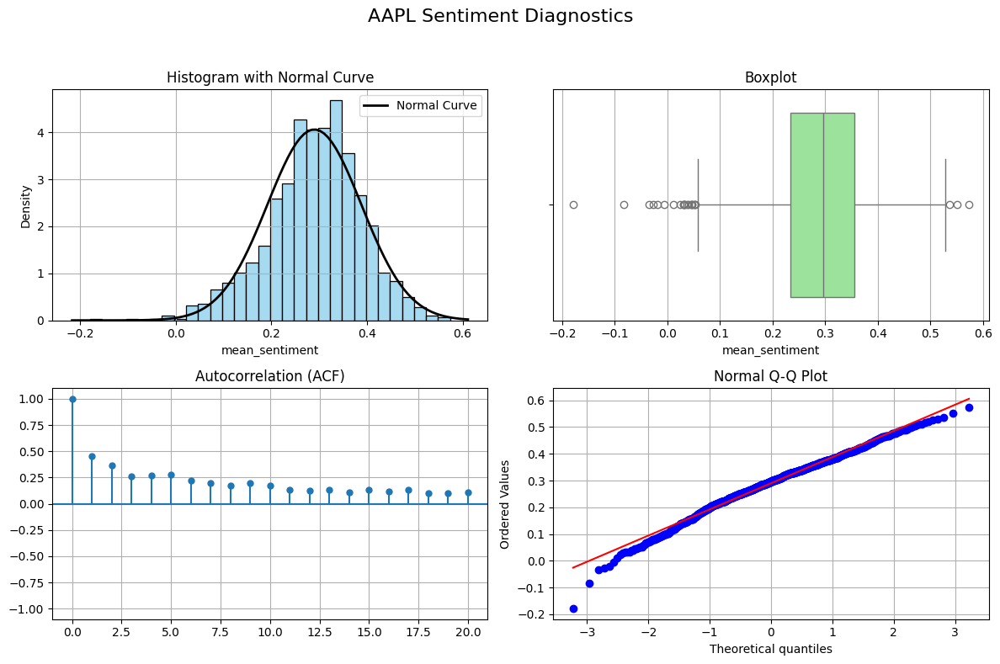

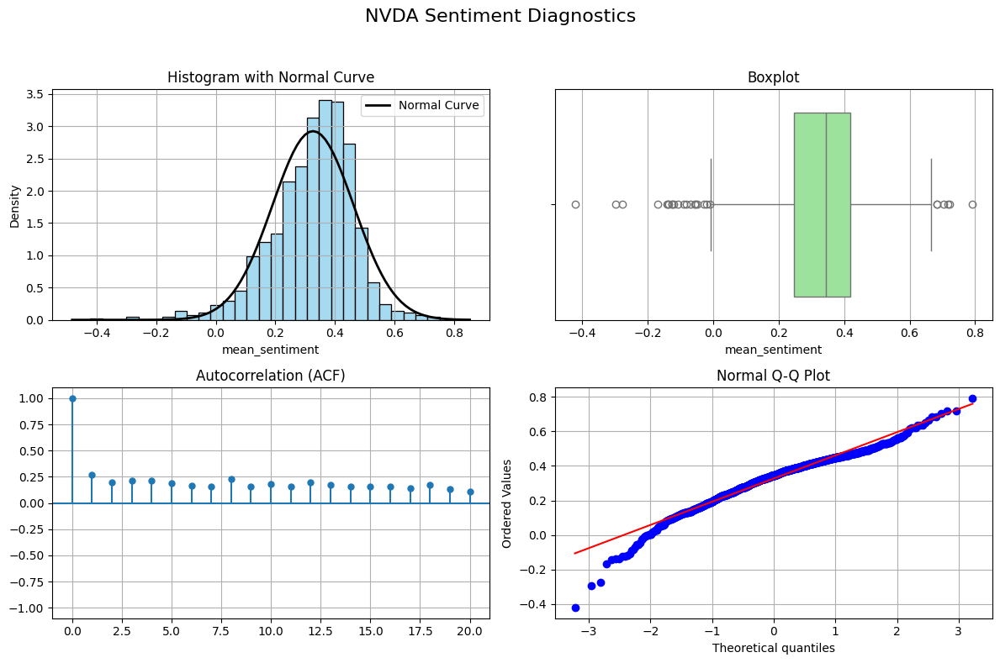

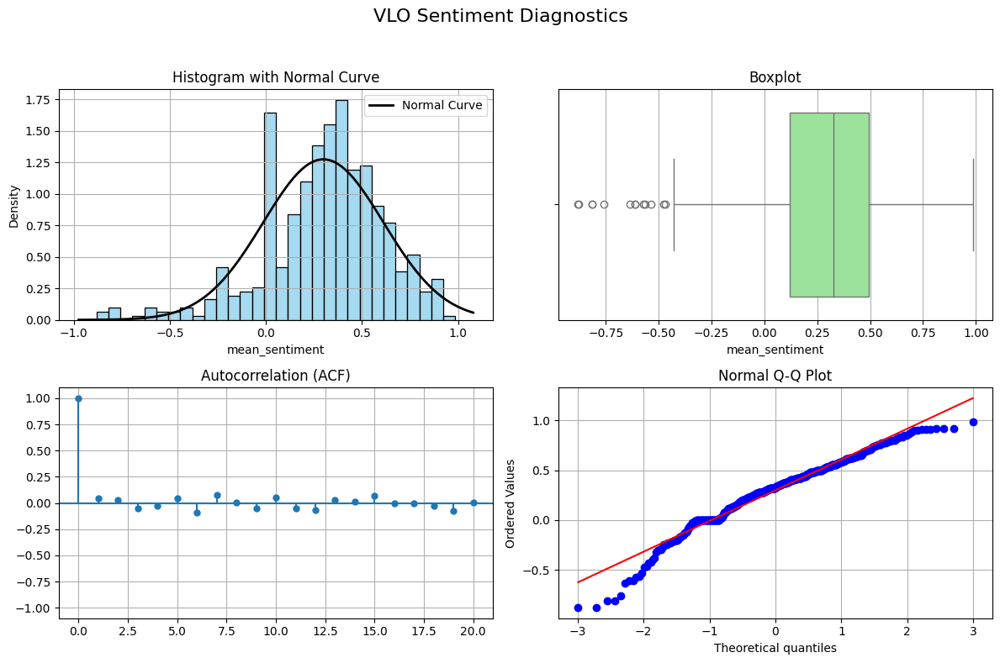

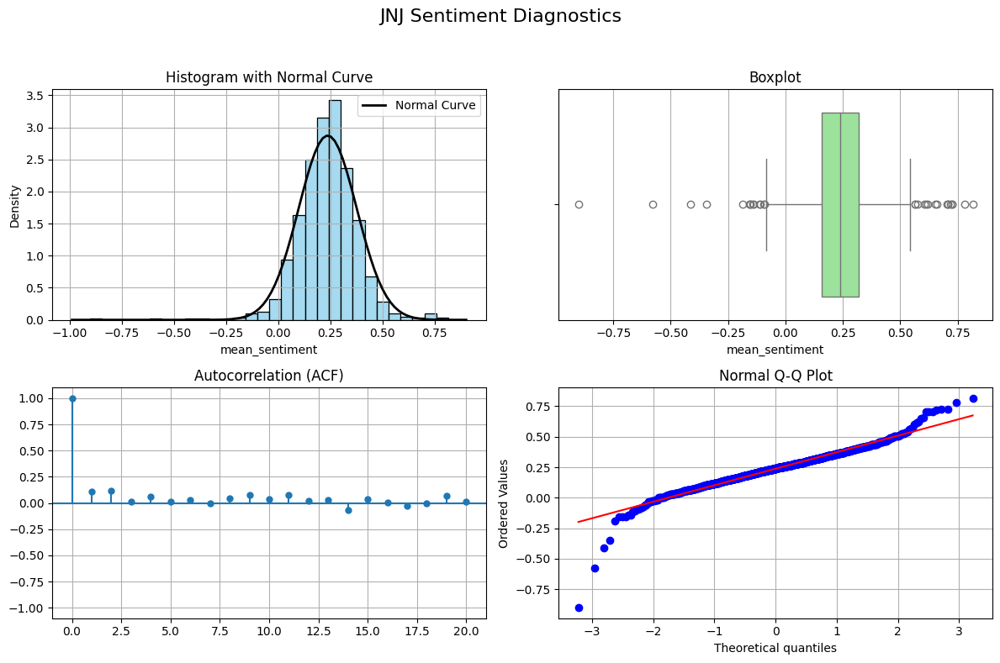

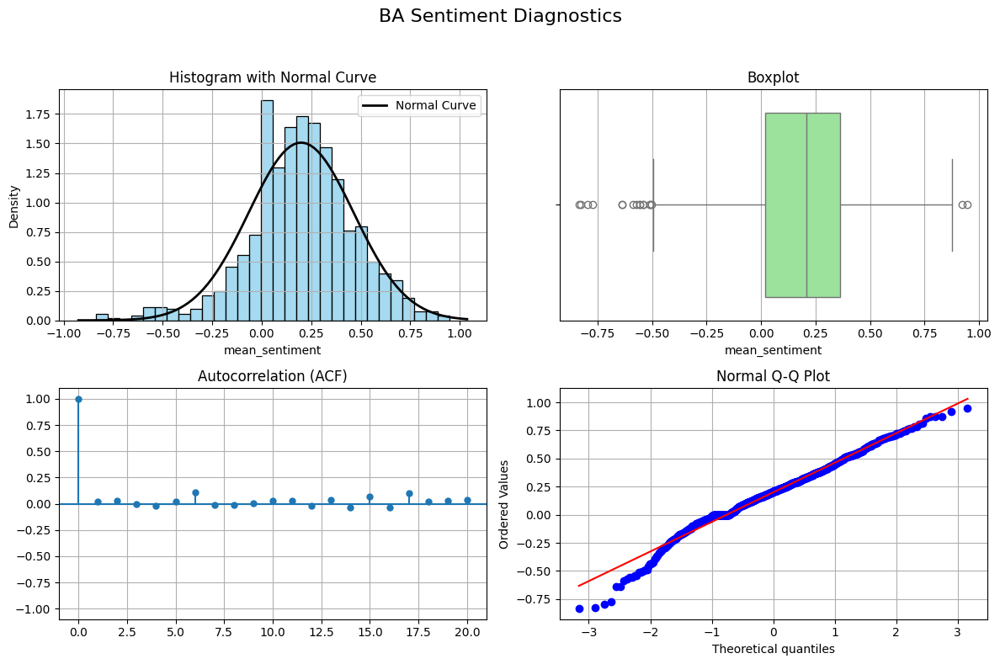

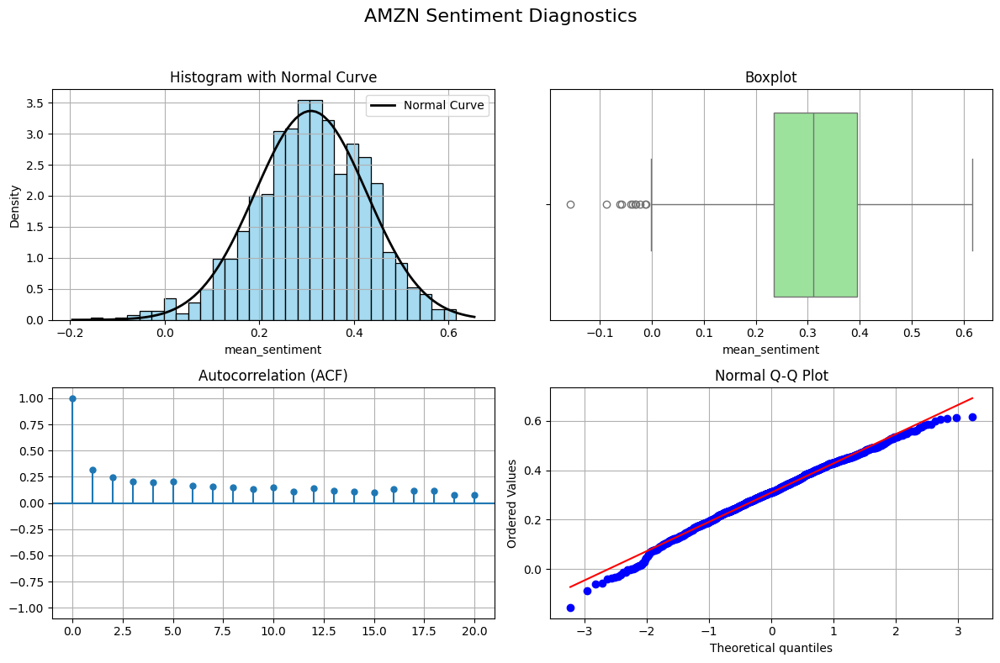

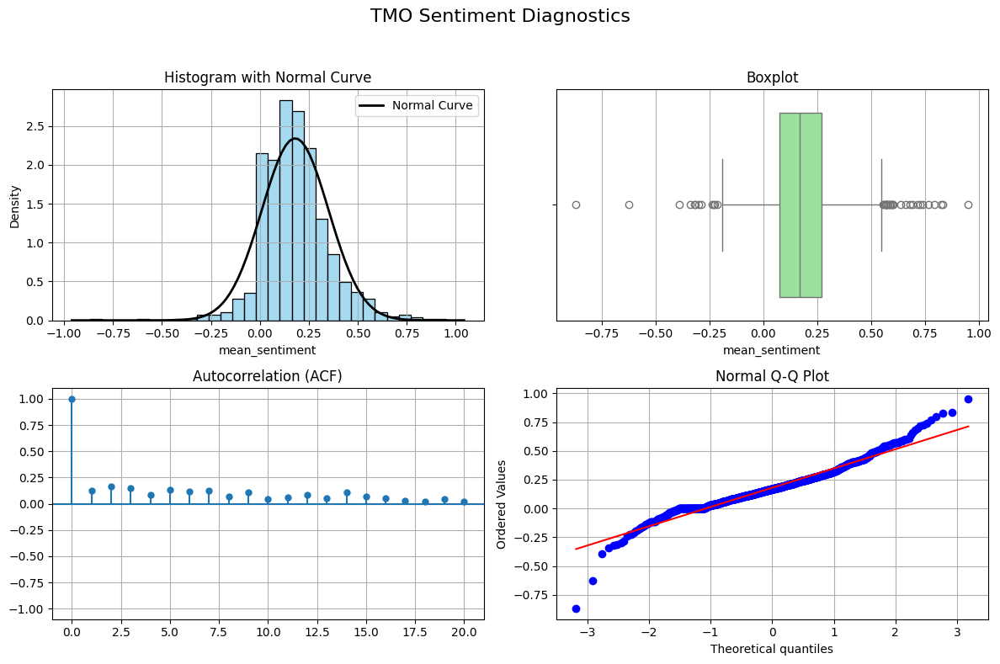

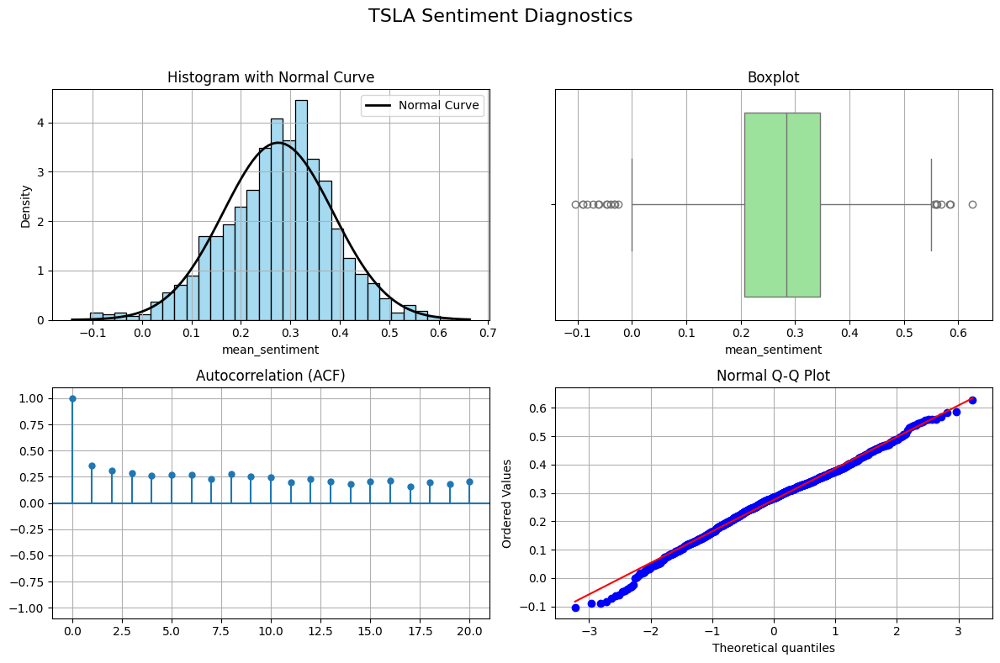

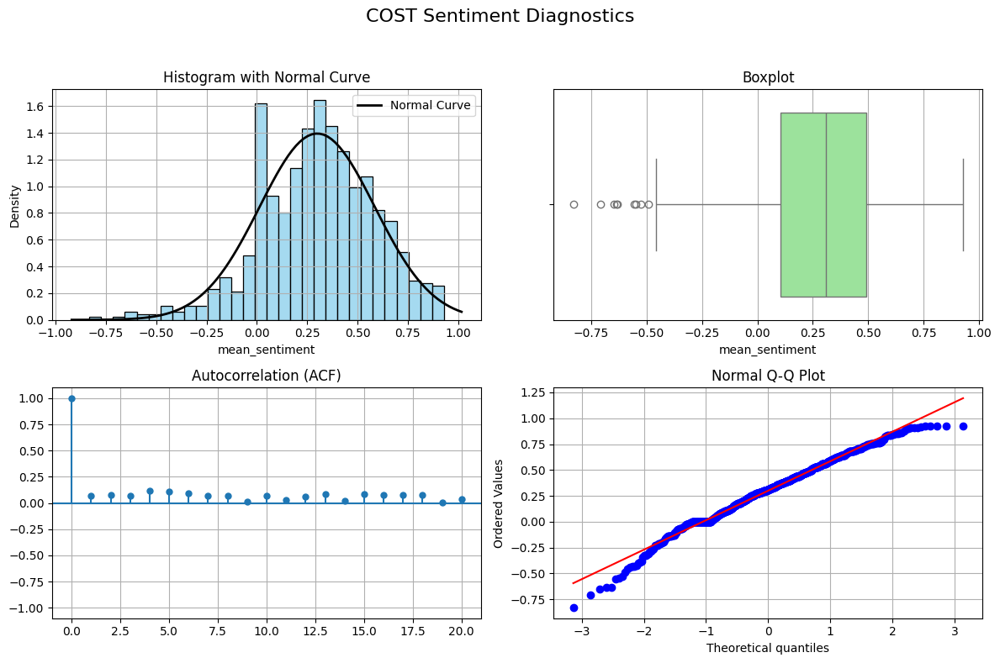

In [102]:

def plot_sentiment_diagnostics(sentiment_series, ticker):
    fig, axs = plt.subplots(2, 2, figsize=(12, 8))
    fig.suptitle(f'{ticker} Sentiment Diagnostics', fontsize=16)

    # 1. Histogram with normal curve
    sns.histplot(sentiment_series.dropna(), kde=False, stat='density', ax=axs[0, 0], color='skyblue', bins=30)
    mu, std = sentiment_series.mean(), sentiment_series.std()
    xmin, xmax = axs[0, 0].get_xlim()
    x = np.linspace(xmin, xmax, 100)
    axs[0, 0].plot(x, norm.pdf(x, mu, std), 'k', linewidth=2, label='Normal Curve')
    axs[0, 0].set_title('Histogram with Normal Curve')
    axs[0, 0].legend()

    # 2. Boxplot
    sns.boxplot(x=sentiment_series.dropna(), ax=axs[0, 1], color='lightgreen')
    axs[0, 1].set_title('Boxplot')

    # 3. Autocorrelation (ACF)
    plot_acf(sentiment_series.dropna(), ax=axs[1, 0], lags=20, alpha=None)
    axs[1, 0].set_title('Autocorrelation (ACF)')
    axs[1, 0].set_ylim(-1.1, 1.1)

    # 4. Q-Q Plot
    probplot(sentiment_series.dropna(), dist="norm", plot=axs[1, 1])
    axs[1, 1].set_title('Normal Q-Q Plot')
    axs[1, 1].get_lines()[0].set_markerfacecolor('blue')
    axs[1, 1].get_lines()[1].set_color('red')

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.savefig(f"{ticker}_sentiment_summary.png")
    plt.show()

for ticker in tickers:
    plot_sentiment_diagnostics (daily_stats[ticker]["mean_sentiment"], ticker)

# Relationship between Sentiment Features and Log Returns

In [103]:
price.date = pd.to_datetime(price.date)
log_returns.reset_index(inplace=True)
log_returns.date = pd.to_datetime(log_returns.date)
price.set_index("date", inplace = True)
log_returns.set_index("date", inplace = True)

In [104]:
stock_data = {}
tickers = ['AAPL', 'NVDA', 'VLO', 'JNJ', 'BA', 'AMZN', 'TMO', 'TSLA', 'COST'] 

for ticker in tickers:
    stock_data[ticker] = pd.DataFrame({
        'log_return': log_returns[ticker],
        'price': price[ticker]
    }).dropna()  

In [105]:
merged_data = {}

for ticker in daily_stats.keys():
    if ticker in stock_data:  # Check if stock data exists for this ticker
        # Ensure dates are aligned and merged
        sentiment_df = daily_stats[ticker].set_index('date')
        stock_df = stock_data[ticker]
        
        # Inner join to keep only dates with both sentiment and stock data
        merged_df = sentiment_df.join(stock_df, how='outer')
        
        # Store the merged DataFrame
        merged_data[ticker] = merged_df.reset_index()  # Optional: keep 'date' as column

# Example: View AAPL's merged data
print(merged_data["AAPL"].head())

        date  mean_sentiment  sentiment_variance  news_count  news_frequency  \
0 2021-01-04        0.404221            0.066646           7        0.212121   
1 2021-01-05        0.141558            0.039668          11        0.250000   
2 2021-01-06        0.251017            0.091350           8        0.190476   
3 2021-01-07        0.057299            0.081728          14        0.378378   
4 2021-01-08        0.162538            0.056179          19        0.333333   

    product  log_return     price  
0  0.085744         NaN       NaN  
1  0.035390    0.011986  127.7365  
2  0.047813   -0.029846  123.9804  
3  0.021681    0.027553  127.4439  
4  0.054179    0.011569  128.9268  


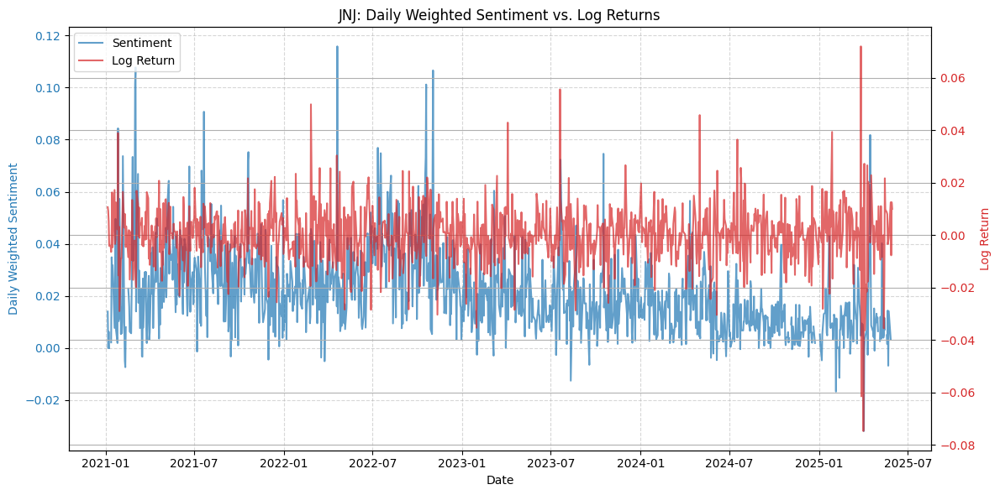

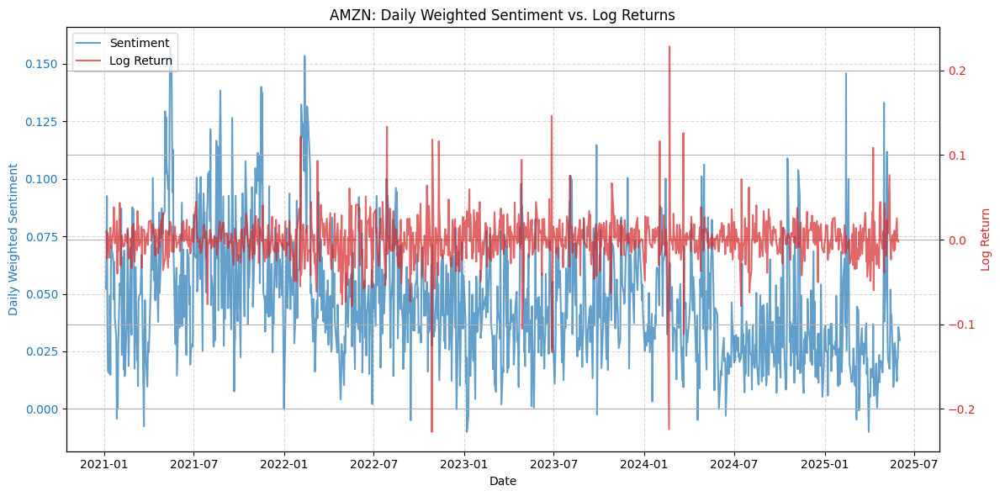

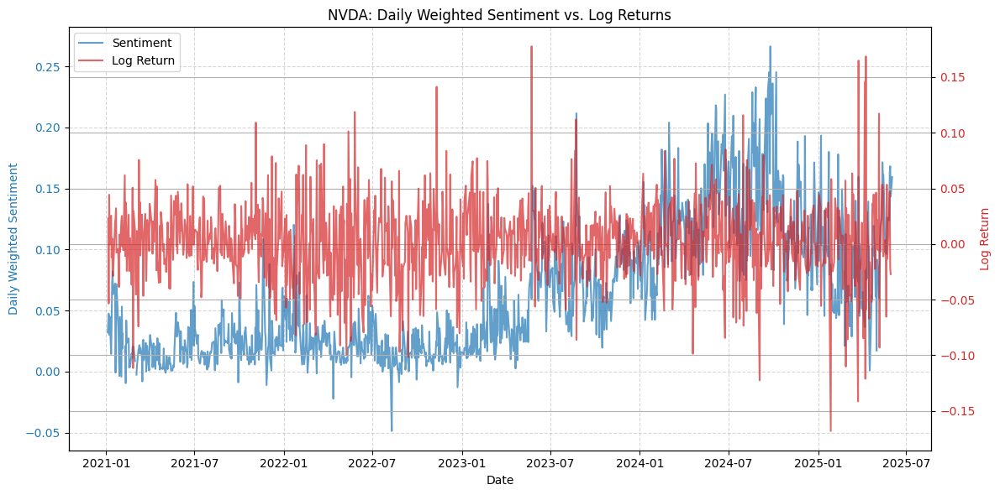

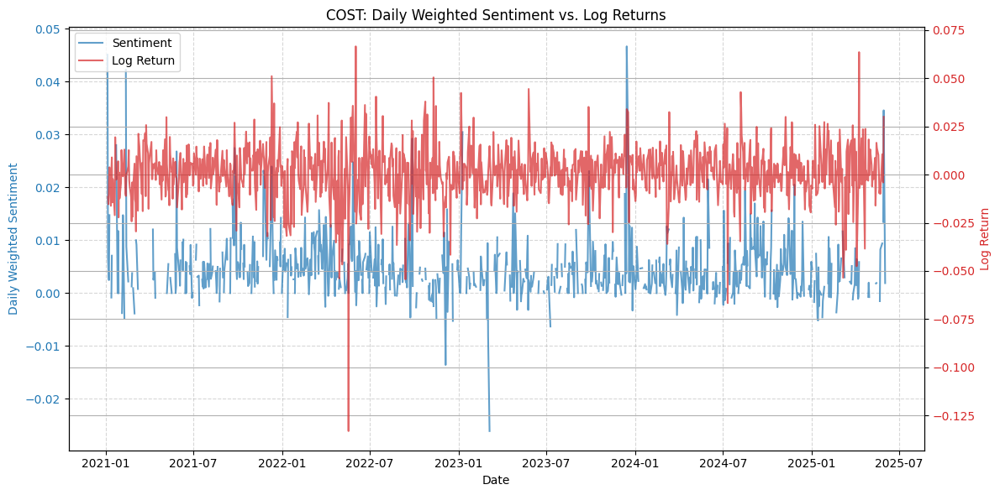

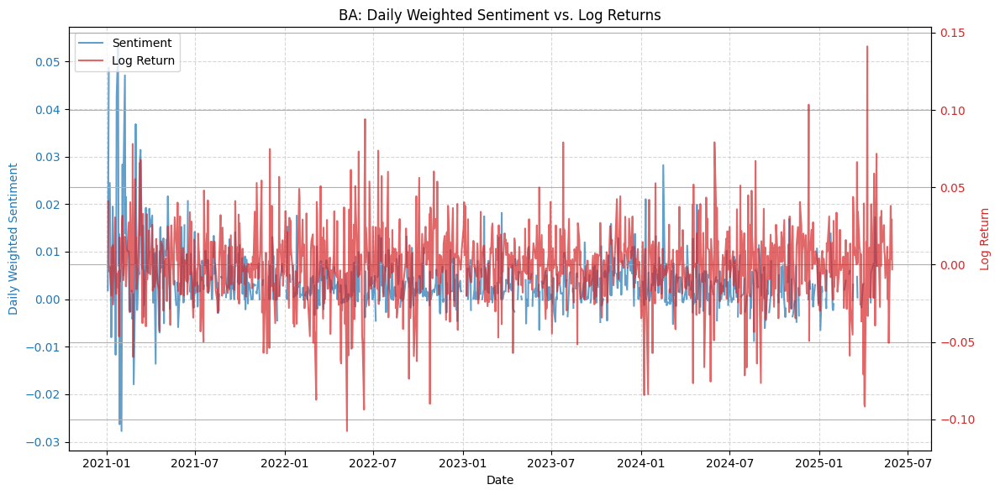

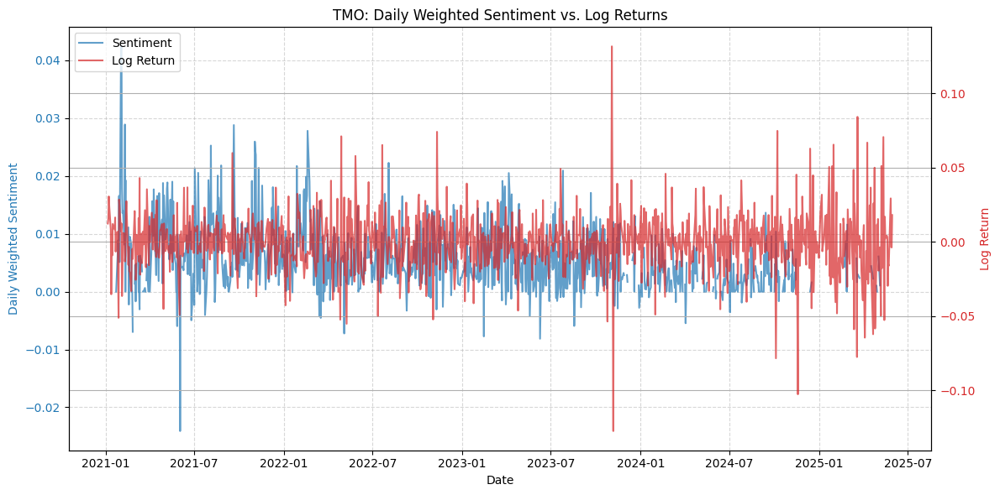

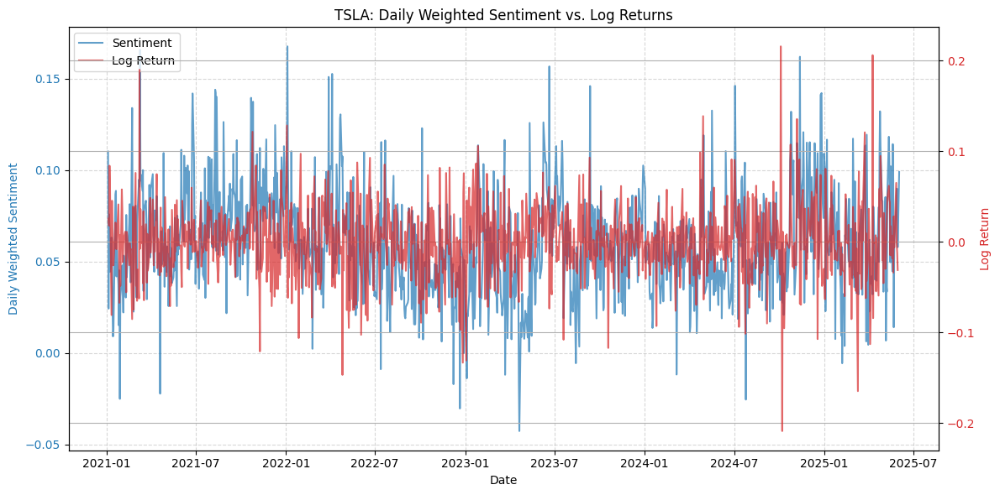

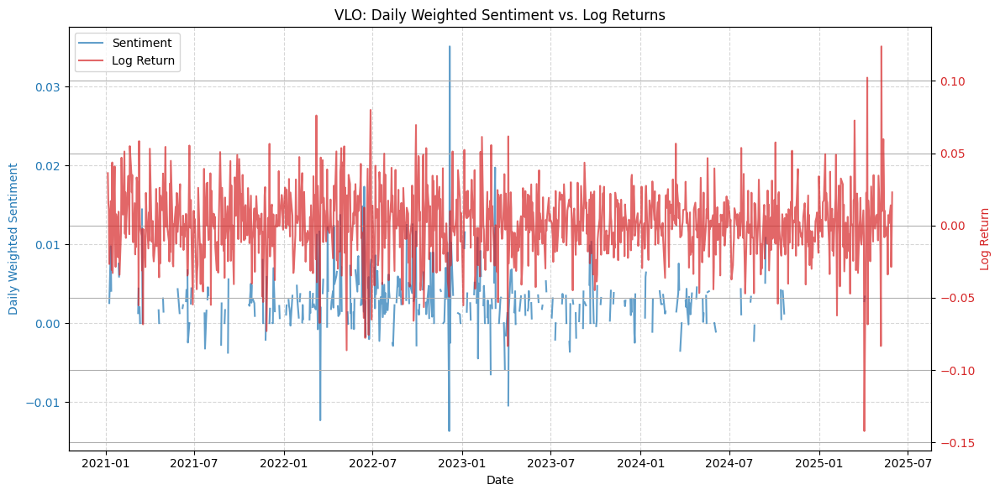

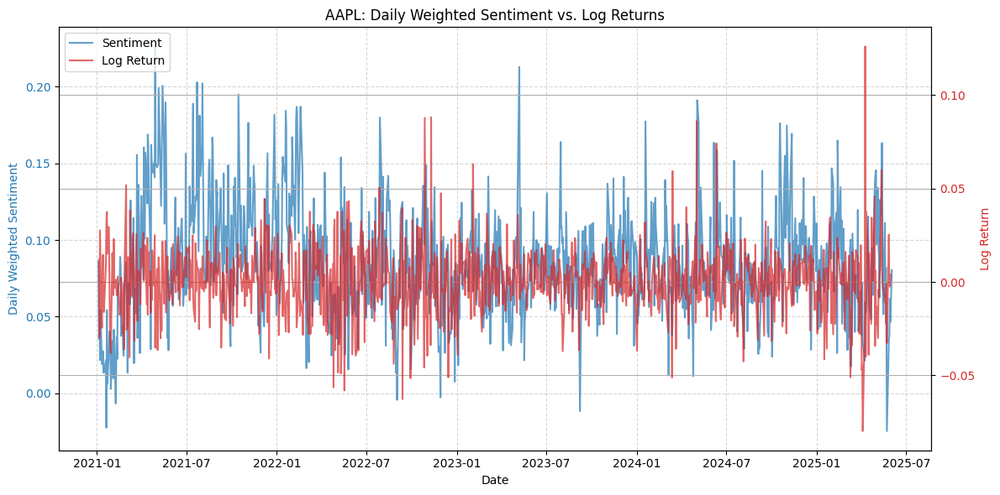

In [106]:
##Time Series Plot of Daily Weighted Sentiment with Log Returns
for ticker, df in merged_data.items():
    # Create figure and primary axis (for sentiment)
    fig, ax1 = plt.subplots(figsize=(12, 6))
    
    # Plot sentiment score (left y-axis)
    color = 'tab:blue'
    ax1.set_xlabel('Date')
    ax1.set_ylabel('Daily Weighted Sentiment', color=color)
    ax1.plot(df['date'], df['product'], 
             color=color, label='Sentiment', alpha=0.7)
    ax1.tick_params(axis='y', labelcolor=color)
    ax1.grid(True, linestyle='--', alpha=0.5)
    
    # Create secondary axis (for log returns)
    ax2 = ax1.twinx()
    color = 'tab:red'
    ax2.set_ylabel('Log Return', color=color)
    ax2.plot(df['date'], df['log_return'], 
             color=color, label='Log Return', alpha=0.7)
    ax2.tick_params(axis='y', labelcolor=color)
    
    # Title and legend
    plt.title(f'{ticker}: Daily Weighted Sentiment vs. Log Returns')
    lines1, labels1 = ax1.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    ax1.legend(lines1 + lines2, labels1 + labels2, loc='upper left')
    
    # Rotate x-axis labels
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

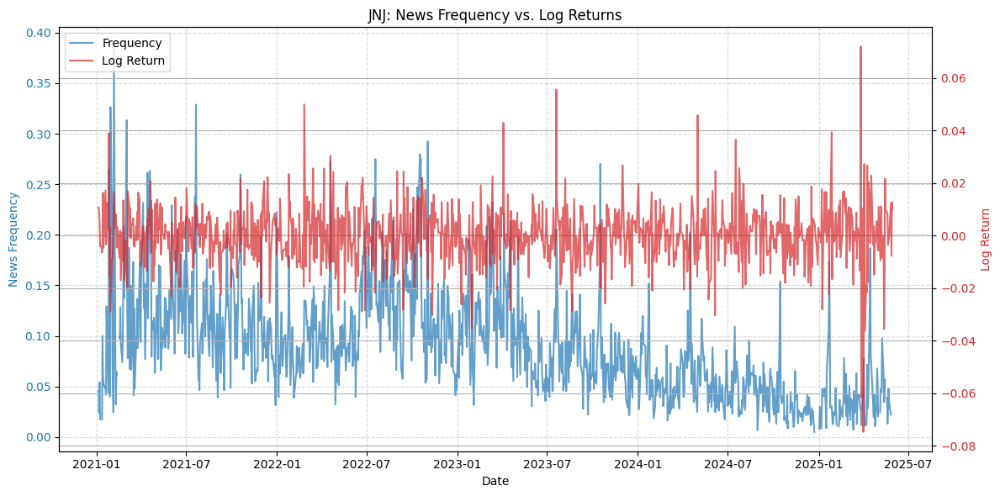

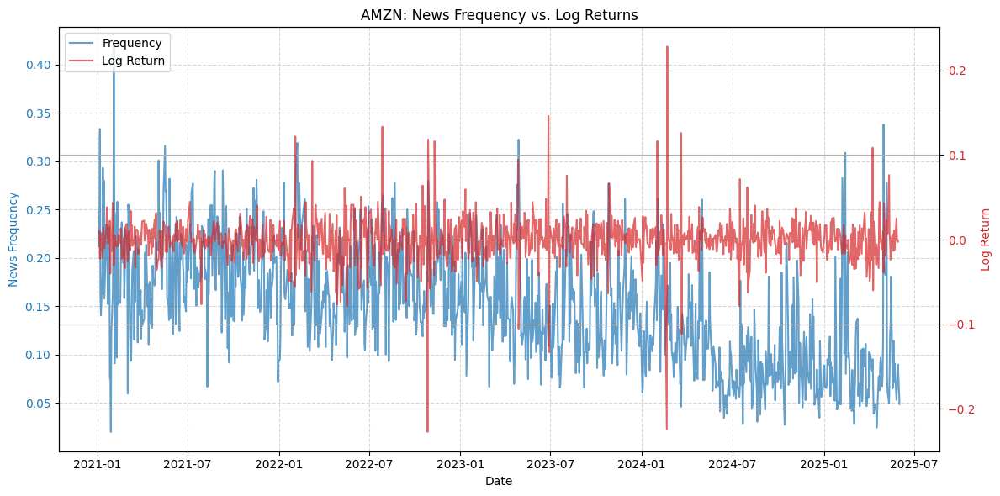

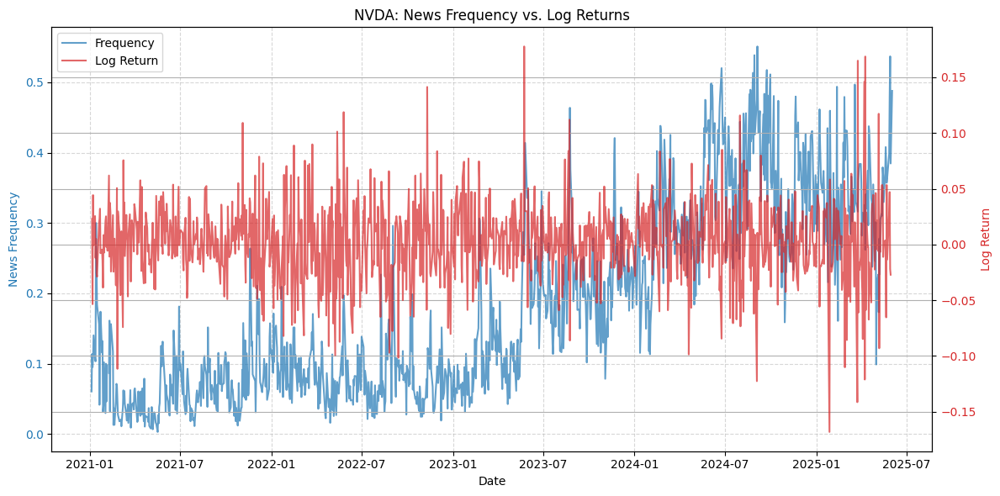

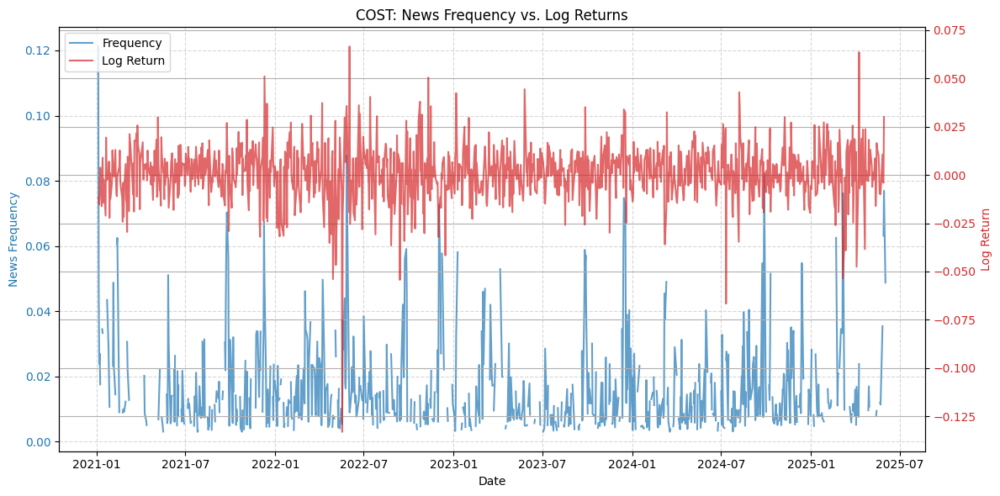

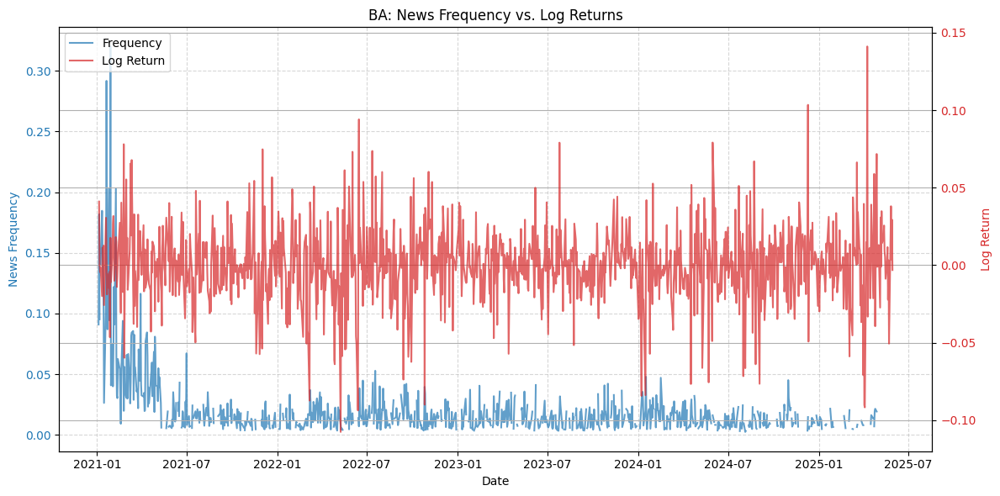

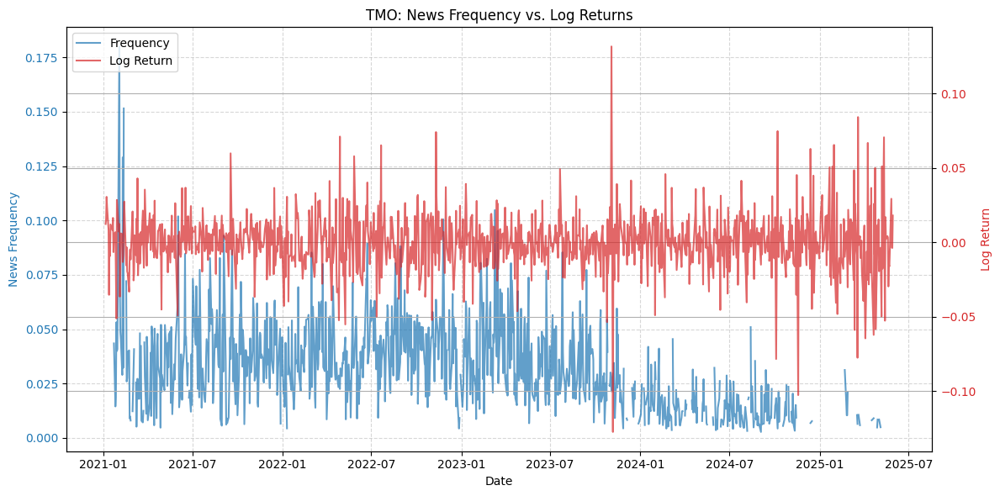

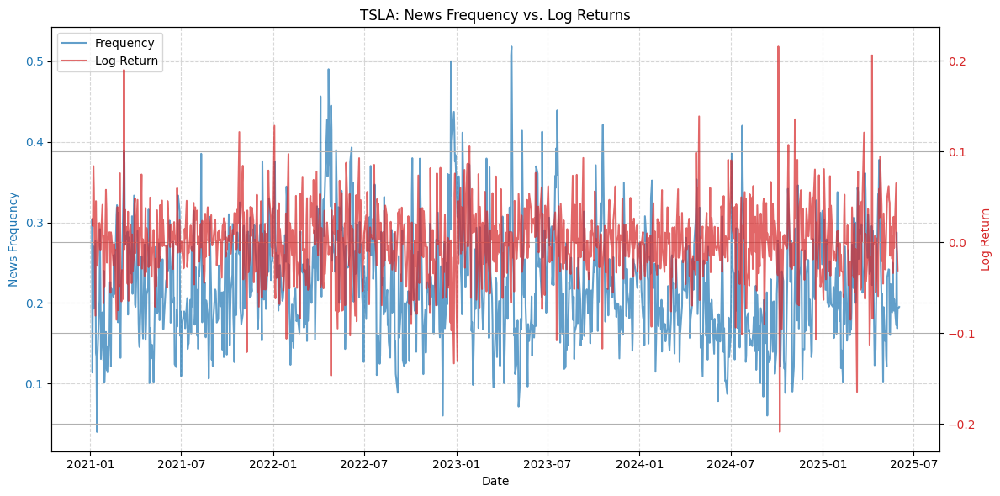

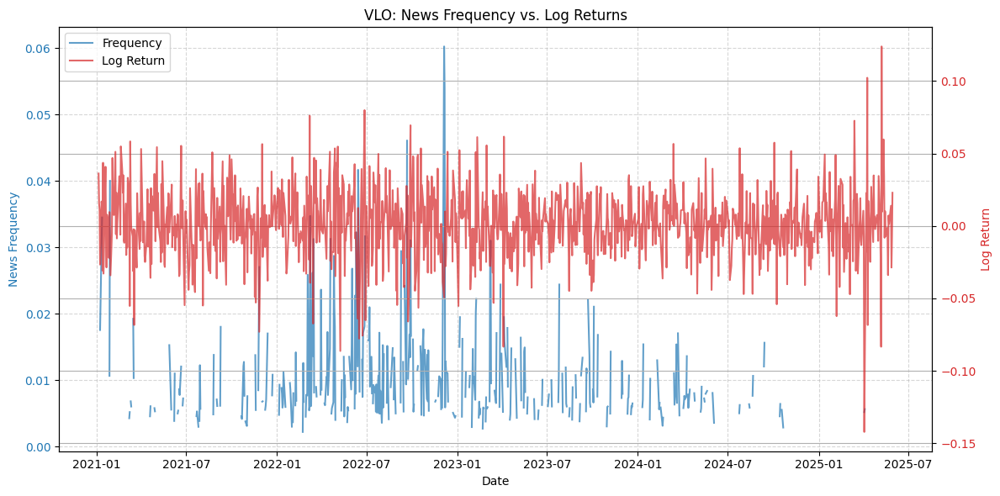

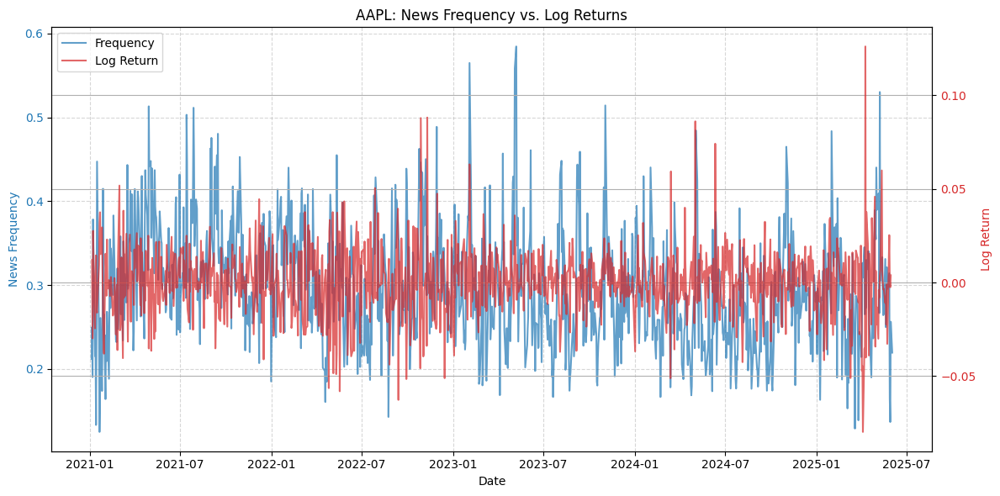

In [107]:
# Time Series Plot of News Frequency and Log Returns
for ticker, df in merged_data.items():
    # Create figure and primary axis (for sentiment)
    fig, ax1 = plt.subplots(figsize=(12, 6))
    
    # Plot sentiment score (left y-axis)
    color = 'tab:blue'
    ax1.set_xlabel('Date')
    ax1.set_ylabel('News Frequency', color=color)
    ax1.plot(df['date'], df['news_frequency'], 
             color=color, label='Frequency', alpha=0.7)
    ax1.tick_params(axis='y', labelcolor=color)
    ax1.grid(True, linestyle='--', alpha=0.5)
    
    # Create secondary axis (for log returns)
    ax2 = ax1.twinx()
    color = 'tab:red'
    ax2.set_ylabel('Log Return', color=color)
    ax2.plot(df['date'], df['log_return'], 
             color=color, label='Log Return', alpha=0.7)
    ax2.tick_params(axis='y', labelcolor=color)
    
    # Title and legend
    plt.title(f'{ticker}: News Frequency vs. Log Returns')
    lines1, labels1 = ax1.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    ax1.legend(lines1 + lines2, labels1 + labels2, loc='upper left')
    
    # Rotate x-axis labels
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

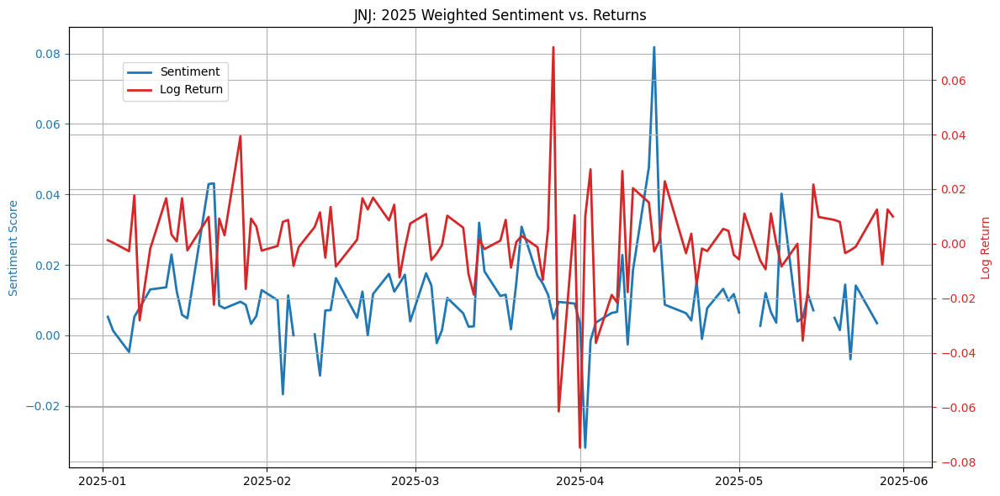

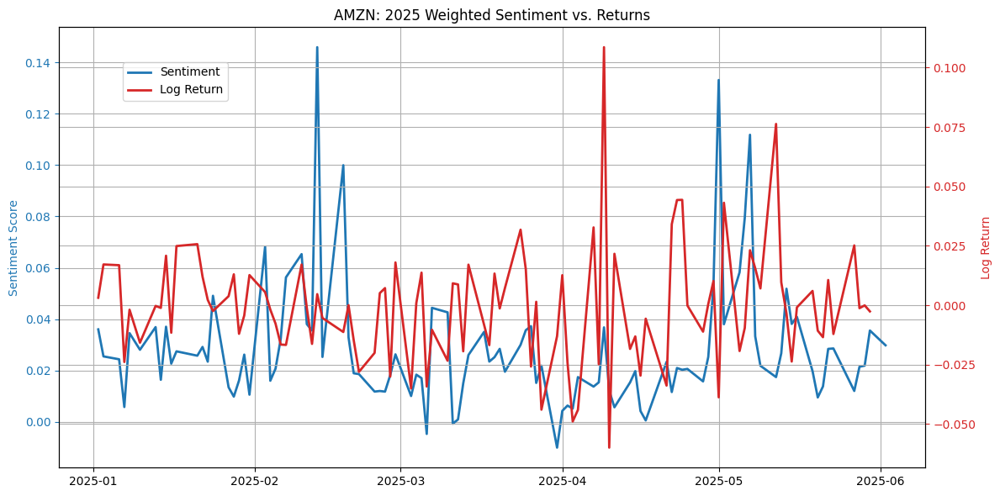

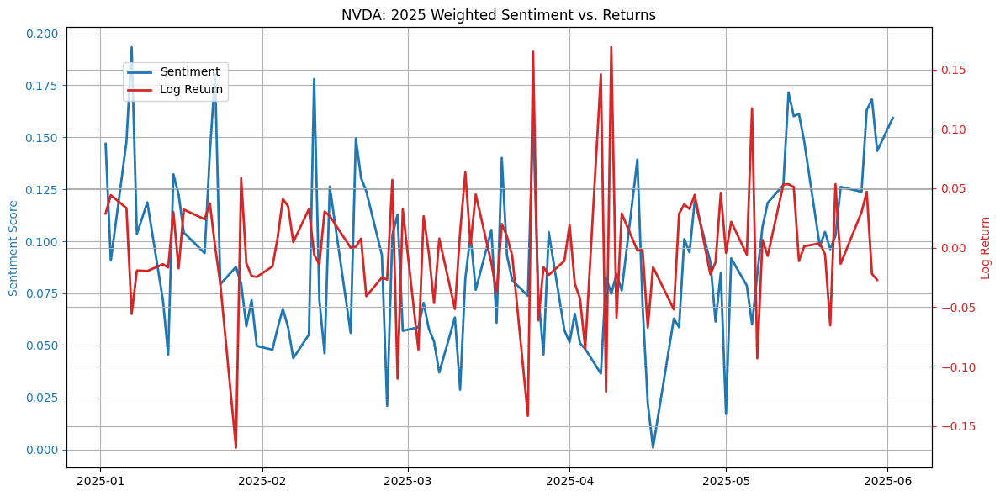

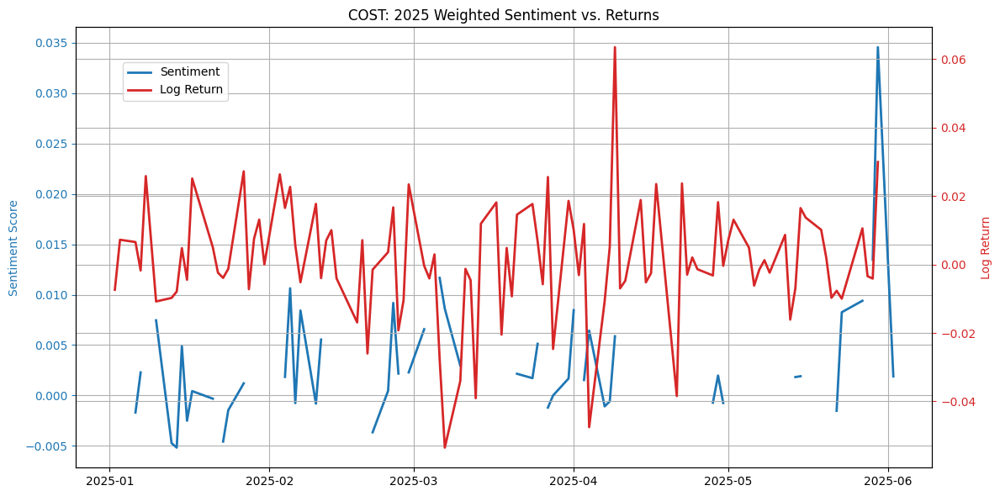

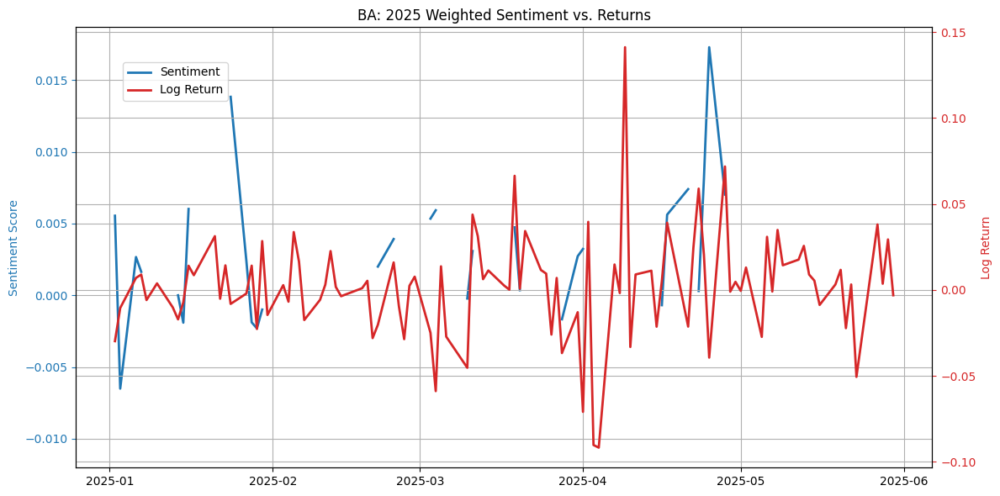

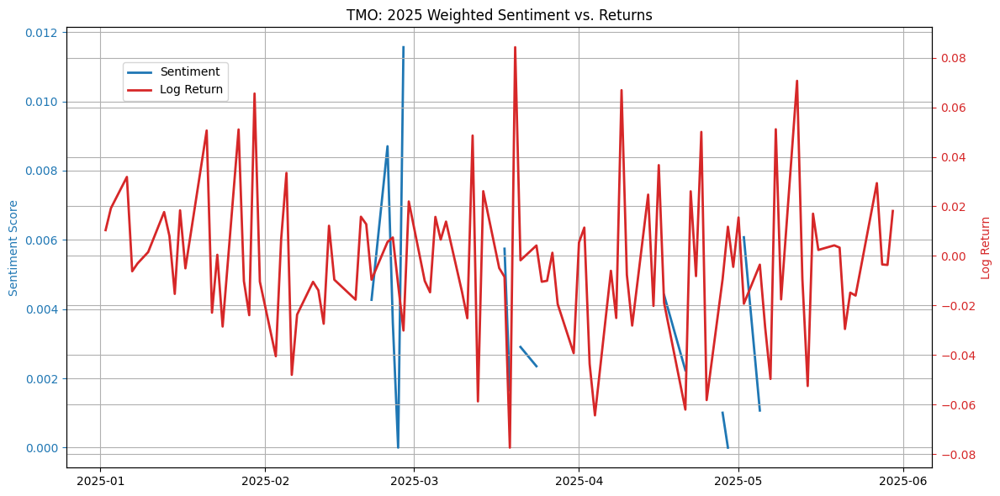

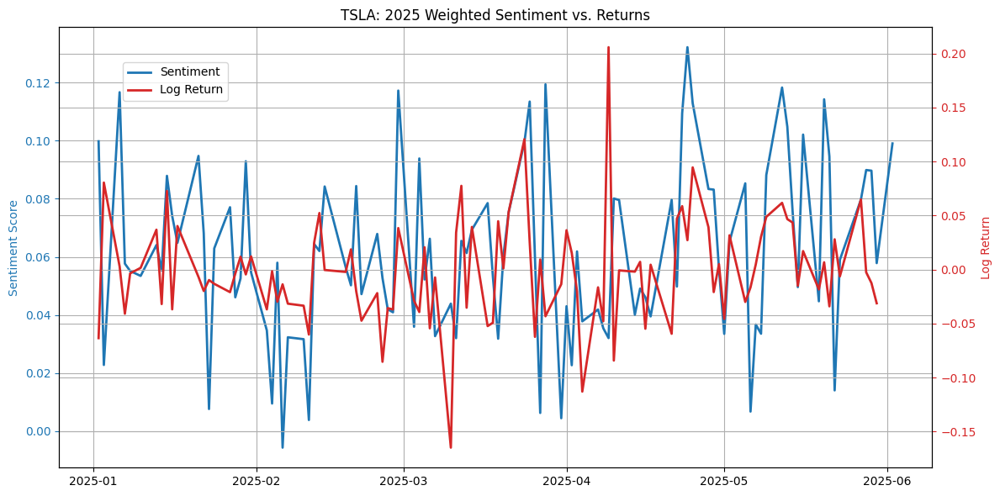

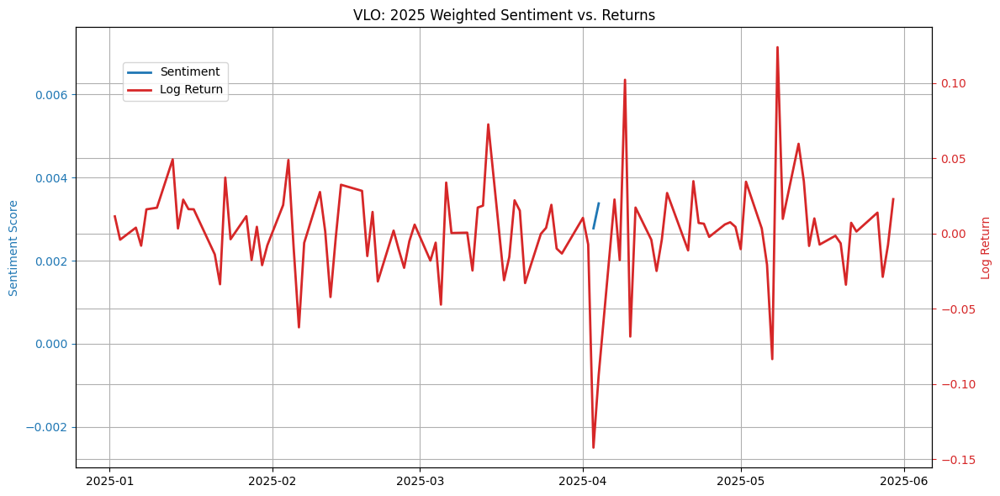

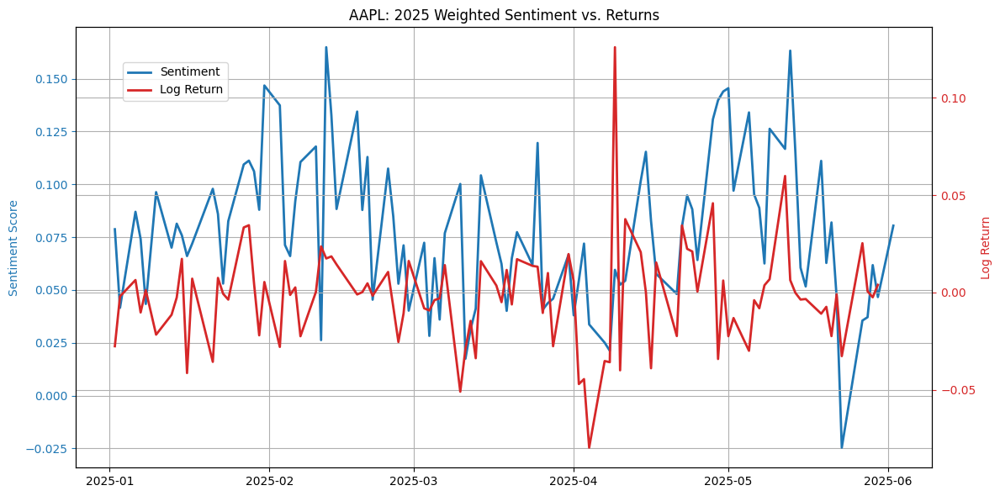

In [108]:
import matplotlib.pyplot as plt
import pandas as pd

plt.style.use('default')  

plt.rcParams['figure.figsize'] = (12, 6)
plt.rcParams['axes.grid'] = True  # Enable grid by default

for ticker, df in merged_data.items():
    try:
        # Filter for 2025 data
        df_2025 = df[df['date'].dt.year == 2025].copy()
        
        if len(df_2025) > 0:
            fig, ax1 = plt.subplots()
            
            # Plot sentiment (blue)
            ax1.plot(df_2025['date'], df_2025['product'], 
                    color='#1f77b4', label='Sentiment', linewidth=2)
            ax1.set_ylabel('Sentiment Score', color='#1f77b4')
            ax1.tick_params(axis='y', colors='#1f77b4')
            
            # Plot returns (red)
            ax2 = ax1.twinx()
            ax2.plot(df_2025['date'], df_2025['log_return'], 
                    color='#d62728', label='Log Return', linewidth=2)
            ax2.set_ylabel('Log Return', color='#d62728')
            ax2.tick_params(axis='y', colors='#d62728')
            
            # Formatting
            plt.title(f'{ticker}: 2025 Weighted Sentiment vs. Returns')
            fig.legend(loc='upper left', bbox_to_anchor=(0.12, 0.88))
            plt.xticks(rotation=45)
            plt.tight_layout()
            plt.savefig(f"{ticker}_news.png")
            plt.show()
        else:
            print(f"No 2025 data for {ticker}")
            
    except Exception as e:
        print(f"Error processing {ticker}: {str(e)}")

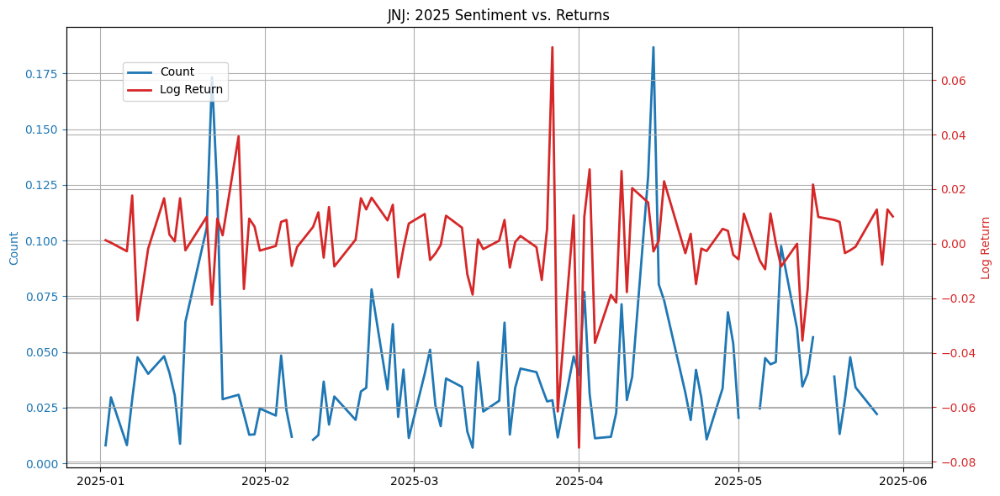

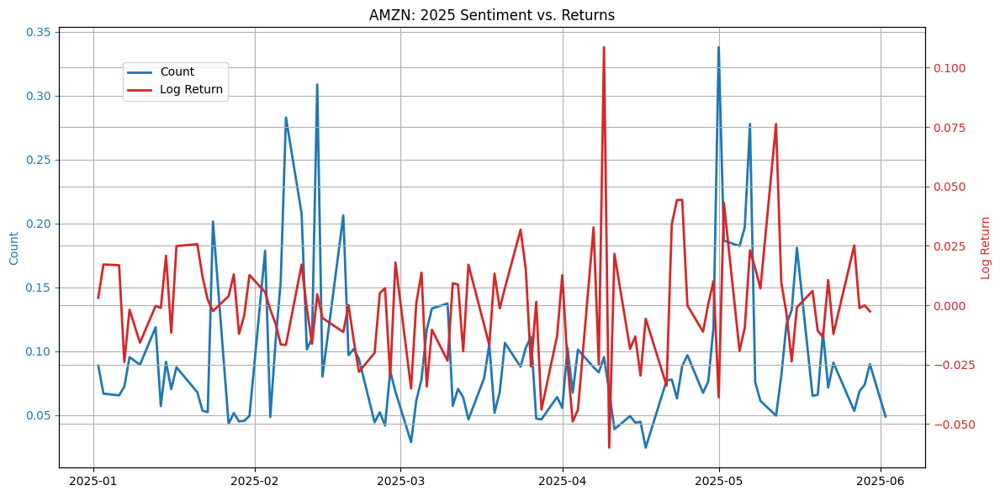

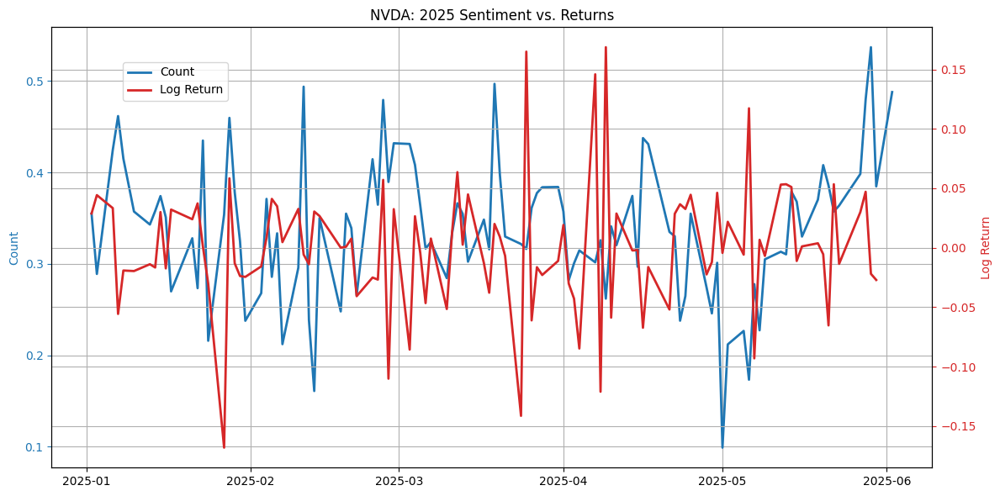

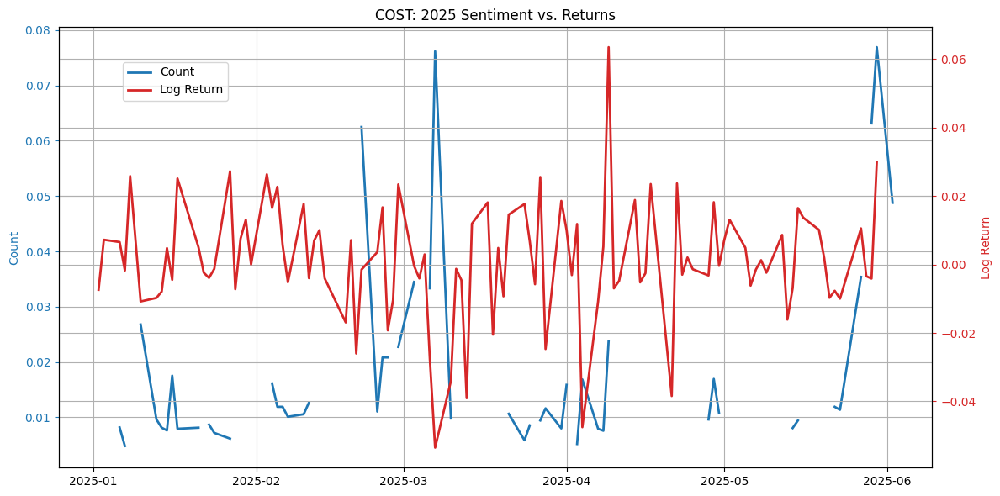

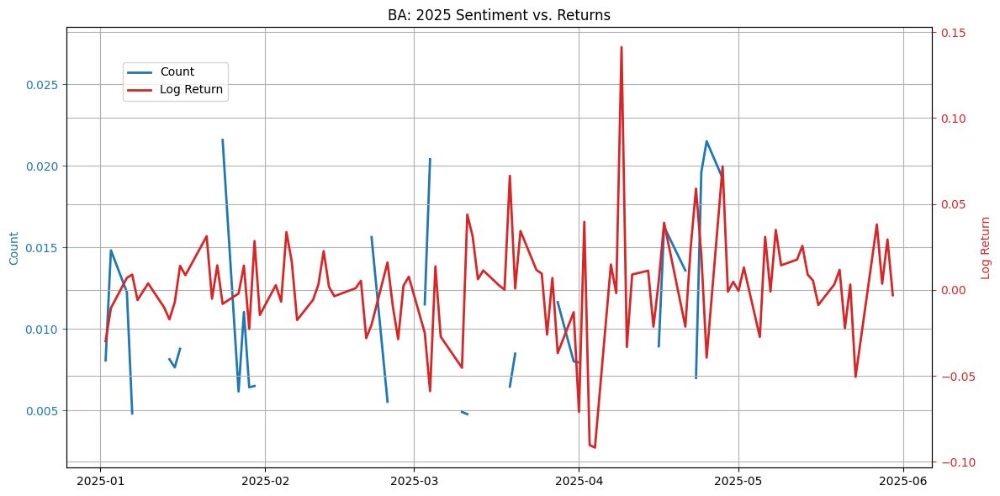

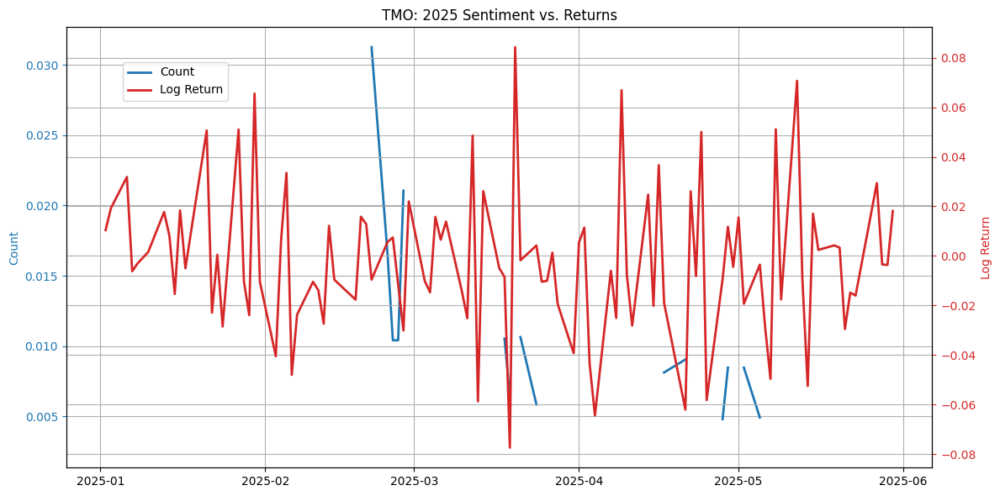

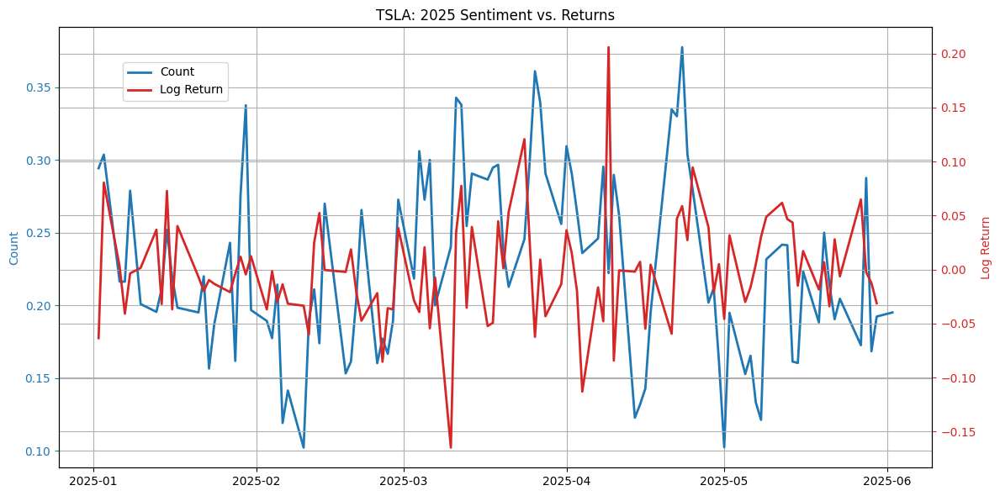

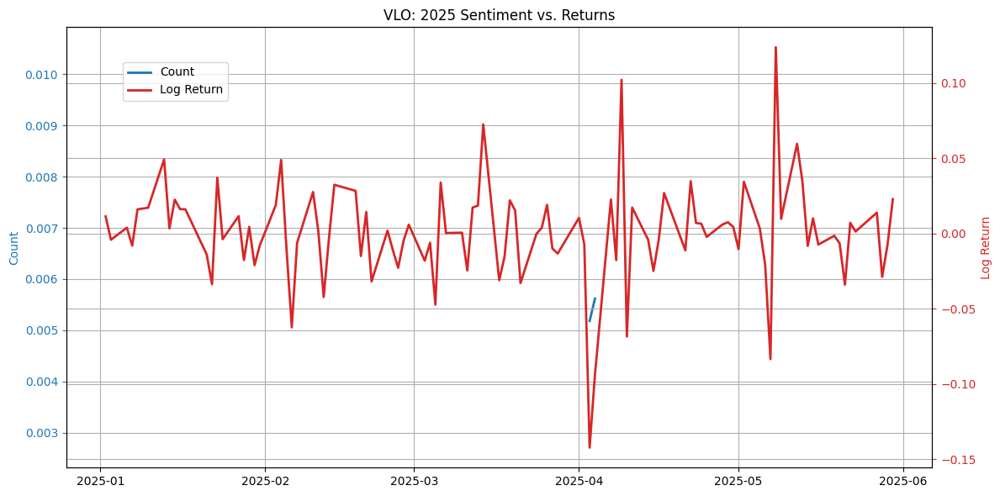

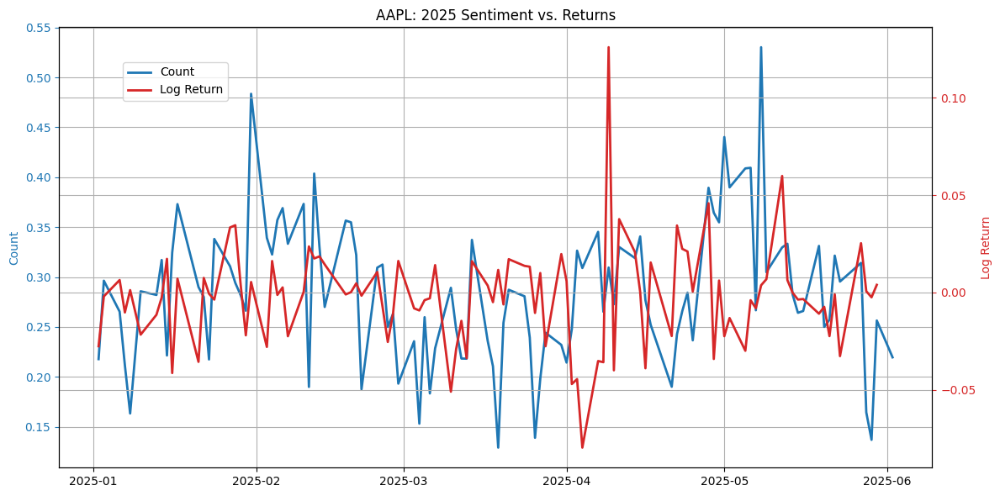

In [111]:
import matplotlib.pyplot as plt
import pandas as pd

# Set modern style (choose one)
plt.style.use('default')  # Reset to default
# OR use one of these available styles:
# print(plt.style.available)  # Shows all available styles

plt.rcParams['figure.figsize'] = (12, 6)
plt.rcParams['axes.grid'] = True  # Enable grid by default

for ticker, df in merged_data.items():
    try:
        # Filter for 2025 data
        df_2025 = df[df['date'].dt.year == 2025].copy()
        
        if len(df_2025) > 0:
            fig, ax1 = plt.subplots()
            
            # Plot sentiment (blue)
            ax1.plot(df_2025['date'], df_2025['news_frequency'], 
                    color='#1f77b4', label='Count', linewidth=2)
            ax1.set_ylabel('Count', color='#1f77b4')
            ax1.tick_params(axis='y', colors='#1f77b4')
            
            # Plot returns (red)
            ax2 = ax1.twinx()
            ax2.plot(df_2025['date'], df_2025['log_return'], 
                    color='#d62728', label='Log Return', linewidth=2)
            ax2.set_ylabel('Log Return', color='#d62728')
            ax2.tick_params(axis='y', colors='#d62728')
            
            # Formatting
            plt.title(f'{ticker}: 2025 Sentiment vs. Returns')
            fig.legend(loc='upper left', bbox_to_anchor=(0.12, 0.88))
            plt.xticks(rotation=45)
            plt.tight_layout()
            plt.show()
        else:
            print(f"No 2025 data for {ticker}")
            
    except Exception as e:
        print(f"Error processing {ticker}: {str(e)}")